In [5]:
import os, site, glob, shutil
usr = site.getusersitepackages()
for pkg in ["torch","torchvision","torchaudio","torchtext","torchdata"]:
    for p in glob.glob(os.path.join(usr, pkg+"*")):
        print("Disabling:", p)
        shutil.move(p, p + ".disabled")


Disabling: /home/sgowrishetty/.local/lib/python3.13/site-packages/torchvision-0.24.0.dist-info
Disabling: /home/sgowrishetty/.local/lib/python3.13/site-packages/torchvision.libs
Disabling: /home/sgowrishetty/.local/lib/python3.13/site-packages/torchgen
Disabling: /home/sgowrishetty/.local/lib/python3.13/site-packages/torch-2.9.0.dist-info
Disabling: /home/sgowrishetty/.local/lib/python3.13/site-packages/torch
Disabling: /home/sgowrishetty/.local/lib/python3.13/site-packages/torchvision
Disabling: /home/sgowrishetty/.local/lib/python3.13/site-packages/torchvision.libs.disabled
Disabling: /home/sgowrishetty/.local/lib/python3.13/site-packages/torchvision-0.24.0.dist-info.disabled
Disabling: /home/sgowrishetty/.local/lib/python3.13/site-packages/torchvision.disabled


In [1]:
import torch, sys, site
print("torch file:", torch.__file__)
print("python:", sys.executable)
print("user site:", site.getusersitepackages())

torch file: /apps/pytorch/2.8.0/lib/python3.13/site-packages/torch/__init__.py
python: /apps/pytorch/2.8.0/bin/python
user site: /home/sgowrishetty/.local/lib/python3.13/site-packages


### Config.yaml

In [33]:
%%writefile config.yaml
# ================= PATHS / INDEX =================
index_csv: "mvtec_outputs/mvtec_index.csv"  # (category, split, label, path, width, height, mode)
out_dir: "runs"

# ================= DEFAULTS (can be overridden per-category) =================
image_size: 384
batch_size: 16
num_workers: 0
val_split: 0.10
augment_prob: 0.50

# ================= MODEL =================
base_channels: 32
latent_dim: 128

# ================= TRAIN =================
epochs: 50
lr: 0.001           # unquoted numbers (floats/ints)
weight_l1: 0.7
weight_ssim: 0.3
device: "cuda"      # "cuda" or "cpu"
seed: 42

# ================= SCORING =================
topk_frac: 0.02              # fraction of highest per-pixel errors to average
threshold_percentile: 95     # percentile of val_good scores for thresholding

# ================= PER-CATEGORY OVERRIDES =================
# Only listed keys here override the defaults above
per_category:
  carpet:     { image_size: 448, topk_frac: 0.01 }
  grid:       { image_size: 448, topk_frac: 0.01 }
  tile:       { image_size: 448, topk_frac: 0.015 }
  bottle:     { image_size: 512, topk_frac: 0.01 }
  cable:      { image_size: 512, topk_frac: 0.015 }
  metal_nut:  { image_size: 448, topk_frac: 0.015 }
  transistor: { image_size: 512, topk_frac: 0.01 }
  zipper:     { image_size: 448, topk_frac: 0.015 }
  pill:       { image_size: 448, topk_frac: 0.015 }
  toothbrush: { image_size: 448, topk_frac: 0.015 }
  leather:    { image_size: 384, topk_frac: 0.025 }
  wood:       { image_size: 384, topk_frac: 0.025 }
  hazelnut:   { image_size: 384, topk_frac: 0.025 }


Overwriting config.yaml


### Data.py

In [13]:
%%writefile data.py
# data.py
import os, random
import pandas as pd
from PIL import Image
from typing import Tuple
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

def _seed_all(seed: int):
    random.seed(seed)
    try:
        import numpy as np
        np.random.seed(seed)
    except Exception:
        pass
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

class MVTECDataset(Dataset):
    """
    Returns dict: {"image": tensor, "label": 0(good)/1(anomaly), "category": str, "path": str}
    """
    def __init__(self, df: pd.DataFrame, img_size: int, is_train: bool, aug_p: float):
        self.df = df.reset_index(drop=True)
        self.img_size = int(img_size)
        self.is_train = is_train
        self.aug_p = float(aug_p)
        self.base_tf = T.Compose([
            T.Resize((self.img_size, self.img_size)),
            T.ToTensor()
        ])
        self.aug = T.Compose([
            T.RandomApply([T.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1)], p=0.7),
            T.RandomApply([T.RandomRotation(degrees=5)], p=0.5),
        ])

    def __len__(self): return len(self.df)

    def _open_rgb(self, p: str) -> Image.Image:
        img = Image.open(p)
        if img.mode != "RGB": img = img.convert("RGB")
        return img

    def __getitem__(self, idx: int):
        row = self.df.iloc[idx]
        path = row["path"]
        label_txt = str(row["label"]).strip().lower()
        y = 0 if label_txt == "good" else 1
        img = self._open_rgb(path)
        if self.is_train and self.aug_p > 0:
            img = self.aug(img)
        x = self.base_tf(img)
        return {"image": x, "label": y, "category": row["category"], "path": path}

def _split_train_val(train_good_df: pd.DataFrame, val_split: float, seed: int) -> Tuple[pd.DataFrame, pd.DataFrame]:
    n = len(train_good_df)
    if n == 0:
        return train_good_df.copy(), train_good_df.copy()
    idx = list(range(n))
    random.Random(seed).shuffle(idx)
    val_n = int(n * float(val_split))
    # keep at least 1 train sample if possible
    val_n = min(max(val_n, 0), max(n - 1, 0))
    val_idx = set(idx[:val_n])
    tr_rows, va_rows = [], []
    for i, r in enumerate(train_good_df.itertuples(index=False)):
        (va_rows if i in val_idx else tr_rows).append(r._asdict())
    return pd.DataFrame(tr_rows), pd.DataFrame(va_rows)

def _normalize_columns(df: pd.DataFrame) -> pd.DataFrame:
    for col in ["split", "label", "category"]:
        if col in df.columns:
            df[col] = df[col].astype(str).str.strip().str.lower()
    return df

def make_loaders(index_csv: str,
                 category: str,
                 img_size=None,
                 image_size=None,
                 batch_size=16,
                 num_workers=4,
                 val_split=0.1,
                 augment_prob=0.5,
                 aug_p=None,
                 seed=42):
    _seed_all(seed)

    # aliases
    if img_size is None and image_size is not None:
        img_size = image_size
    if aug_p is None:
        aug_p = augment_prob
    img_size = int(img_size)

    # load + normalize
    df = pd.read_csv(index_csv)
    df = _normalize_columns(df)

    # subset category (compare in lowercase)
    cat_key = str(category).strip().lower()
    df_cat = df.copy() if cat_key == "global" else df[df["category"] == cat_key].copy()

    # train = only train-good
    tr_good = df_cat[(df_cat["split"] == "train") & (df_cat["label"] == "good")].copy()
    tr_df, va_df = _split_train_val(tr_good, float(val_split), seed)

    # final sanity
    if len(tr_df) == 0:
        raise RuntimeError(
            "\n".join([
                "[make_loaders] EMPTY TRAIN after filtering.",
                f"  category requested : {category}",
                f"  CSV                : {os.path.abspath(index_csv)}",
                f"  df_cat rows        : {len(df_cat)}",
                f"  train-good rows    : {len(tr_good)}",
                f"  val_split          : {val_split}",
                "  Hints:",
                "   - Ensure split is 'train' / 'test' and label 'good' (any case/space OK now).",
                "   - Ensure category matches (we compare in lowercase).",
                "   - Try val_split: 0.0 if the category is tiny."
            ])
        )

    ds_tr = MVTECDataset(tr_df, img_size, is_train=True,  aug_p=aug_p)
    ds_va = MVTECDataset(va_df, img_size, is_train=False, aug_p=0.0)

    dl_tr = DataLoader(ds_tr, batch_size=int(batch_size), shuffle=True,
                       num_workers=int(num_workers), pin_memory=True, drop_last=False)
    dl_va = DataLoader(ds_va, batch_size=int(batch_size), shuffle=False,
                       num_workers=int(num_workers), pin_memory=True)

    print(f"[make_loaders] category={category} | train={len(ds_tr)} | val={len(ds_va)} | img_size={img_size} | bs={batch_size}")
    return dl_tr, dl_va


Overwriting data.py


### Autoencoder.py

In [4]:
%%writefile autoencoder.py
import torch
import torch.nn as nn
import torch.nn.functional as F

def conv_block(cin, cout, k=3, s=1, p=1):
    return nn.Sequential(
        nn.Conv2d(cin, cout, k, s, p, bias=False),
        nn.BatchNorm2d(cout),
        nn.ReLU(inplace=True),
        nn.Conv2d(cout, cout, k, s, p, bias=False),
        nn.BatchNorm2d(cout),
        nn.ReLU(inplace=True),
    )

class UNetAE(nn.Module):
    """
    Light U-Net autoencoder (RGB->RGB) with 4 down/ups and skip connections.
    """
    def __init__(self, base=32, latent=256):
        super().__init__()
        self.enc1 = conv_block(3, base)
        self.enc2 = conv_block(base, base*2)
        self.enc3 = conv_block(base*2, base*4)
        self.enc4 = conv_block(base*4, base*8)

        self.down = nn.MaxPool2d(2)

        self.bottleneck = nn.Sequential(
            nn.Conv2d(base*8, latent, 3, 1, 1, bias=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(latent, base*8, 3, 1, 1, bias=False),
            nn.ReLU(inplace=True),
        )

        self.up4 = nn.ConvTranspose2d(base*8, base*4, 2, 2)
        self.dec4 = conv_block(base*8, base*4)

        self.up3 = nn.ConvTranspose2d(base*4, base*2, 2, 2)
        self.dec3 = conv_block(base*4, base*2)

        self.up2 = nn.ConvTranspose2d(base*2, base, 2, 2)
        self.dec2 = conv_block(base*2, base)

        self.out_conv = nn.Conv2d(base, 3, 1)

    def forward(self, x):
        e1 = self.enc1(x)           # B, base, H, W
        e2 = self.enc2(self.down(e1))    # B, 2b, H/2, W/2
        e3 = self.enc3(self.down(e2))    # B, 4b, H/4, W/4
        e4 = self.enc4(self.down(e3))    # B, 8b, H/8, W/8

        b = self.bottleneck(e4)          # B, 8b, H/8, W/8

        d4 = self.up4(b)                 # B, 4b, H/4, W/4
        d4 = self.dec4(torch.cat([d4, e3], dim=1))

        d3 = self.up3(d4)                # B, 2b, H/2, W/2
        d3 = self.dec3(torch.cat([d3, e2], dim=1))

        d2 = self.up2(d3)                # B, b, H, W
        d2 = self.dec2(torch.cat([d2, e1], dim=1))

        out = self.out_conv(d2)
        out = torch.sigmoid(out)         # keep outputs in [0,1]
        return out


Overwriting autoencoder.py


### Losses.py

In [4]:
%%writefile losses.py
import torch
import torch.nn as nn
import torch.nn.functional as F

# ---- SSIM (simplified, window = 11x11 Gaussian approx with avg pooling) ----
def _ssim_map(x, y, C1=0.01**2, C2=0.03**2):
    # x,y in [0,1], shape (B,C,H,W)
    mu_x = F.avg_pool2d(x, 11, 1, 5)
    mu_y = F.avg_pool2d(y, 11, 1, 5)

    sigma_x  = F.avg_pool2d(x*x, 11, 1, 5) - mu_x*mu_x
    sigma_y  = F.avg_pool2d(y*y, 11, 1, 5) - mu_y*mu_y
    sigma_xy = F.avg_pool2d(x*y, 11, 1, 5) - mu_x*mu_y

    ssim_n = (2*mu_x*mu_y + C1) * (2*sigma_xy + C2)
    ssim_d = (mu_x*mu_x + mu_y*mu_y + C1) * (sigma_x + sigma_y + C2)
    ssim = ssim_n / (ssim_d + 1e-12)
    return ssim

def ssim_loss(x, y):
    ssim = _ssim_map(x, y)
    # convert similarity (1 best) to loss (0 best)
    return (1 - ssim).clamp(min=0, max=1).mean()

class L1_SSIM_Loss(nn.Module):
    def __init__(self, w_l1=0.8, w_ssim=0.2):
        super().__init__()
        self.w_l1 = w_l1
        self.w_ssim = w_ssim

    def forward(self, x, xhat):
        l1 = F.l1_loss(xhat, x)
        s  = ssim_loss(xhat, x)
        return self.w_l1 * l1 + self.w_ssim * s

# ---- Top-k reconstruction error for image-level score ----
def topk_error(x, xhat, topk_frac=0.02):
    """
    x,xhat: (B,3,H,W) in [0,1]
    Returns:
      scores: (B,) mean of top-k per-pixel absolute errors (over channel avg)
      errmap: (B,1,H,W) absolute error map (channel-averaged)
    """
    err = (x - xhat).abs().mean(dim=1, keepdim=True)  # (B,1,H,W)
    B, _, H, W = err.shape
    k = max(1, int(topk_frac * H * W))
    flat = err.view(B, -1)
    topk = torch.topk(flat, k, dim=1).values
    scores = topk.mean(dim=1)
    return scores, err


Overwriting losses.py


### Train.py

In [31]:
%%writefile train.py
# train.py
import os
import json
import yaml
import argparse
from datetime import datetime

import torch
from torch.optim import Adam
from tqdm import tqdm
import numpy as np
import pandas as pd

from data import make_loaders
from models.autoencoder import UNetAE
from losses import L1_SSIM_Loss, topk_error

from datetime import datetime, timezone

import torch.multiprocessing as mp
mp.set_start_method("spawn", force=True)


# ---------------- Utils ----------------
def set_seed(s: int):
    import random, numpy as np, torch
    random.seed(s)
    np.random.seed(s)
    torch.manual_seed(s)
    torch.cuda.manual_seed_all(s)

def pick_device(pref: str = "cuda"):
    pref = (pref or "cuda").lower()
    if pref == "cuda" and torch.cuda.is_available():
        return torch.device("cuda")
    return torch.device("cpu")

def save_ckpt(path, model, opt, epoch, best_val):
    os.makedirs(os.path.dirname(path), exist_ok=True)
    torch.save(
        {"model": model.state_dict(), "opt": opt.state_dict(), "epoch": epoch, "best_val": best_val},
        path,
    )

def percentile_threshold(scores, pct=95):
    # scores: list/array of floats
    arr = np.asarray(scores, dtype=np.float32)
    pct = float(pct)
    pct = min(max(pct, 0.0), 100.0)
    return float(np.percentile(arr, pct))


def resolve_cfg(global_cfg: dict, category: str) -> dict:
    """Merge global cfg with per-category overrides (if present)."""
    cfg = dict(global_cfg)  # shallow copy
    overrides = (global_cfg.get("per_category") or {}).get(category, {})
    cfg.update(overrides)  # only keys listed in per_category override
    cfg["category"] = category
    return cfg


# ---------------- Train / Eval ----------------
def _get_images_from_batch(batch):
    # Supports either dict batches or tuple batches from your MVTECDataset
    if isinstance(batch, dict):
        return batch["image"]
    # tuple like: (x, y, category, path)
    return batch[0]

def do_epoch(model, loader, loss_fn, opt=None, device=torch.device("cpu")):
    is_train = opt is not None
    model.train(is_train)
    running, n = 0.0, 0
    for batch in loader:
        x = _get_images_from_batch(batch).to(device, non_blocking=True)
        if is_train:
            opt.zero_grad(set_to_none=True)
        y_hat = model(x)
        loss = loss_fn(y_hat, x)
        if is_train:
            loss.backward()
            opt.step()
        running += loss.item() * x.size(0)
        n += x.size(0)
    return running / max(n, 1)

@torch.no_grad()
def collect_val_scores(model, loader, device, topk_frac):
    """Compute per-image reconstruction error using top-k pixel errors.
       Rebuild a 0-worker loader to avoid CUDA+fork issues, and gracefully
       fall back to CPU if CUDA init fails mid-flight.
    """
    from torch.utils.data import DataLoader

    # Rebuild a single-process val loader (no workers, no pinning)
    val_ds = loader.dataset
    val_loader_sp = DataLoader(
        val_ds,
        batch_size=loader.batch_size,
        shuffle=False,
        num_workers=0,
        pin_memory=False,
    )

    def _run(the_device):
        model.eval().to(the_device)
        out_scores = []
        for batch in val_loader_sp:
            # batch comes from your MVTECDataset: (x, y, cat, path)
            x = batch[0].to(the_device, non_blocking=False)
            y_hat = model(x)
            out = topk_error(y_hat, x, topk_frac=topk_frac)  # (scores, heatmap?) or tensor
            s = out[0] if isinstance(out, (tuple, list)) else out
            out_scores.extend(s.detach().cpu().tolist())
        return out_scores

    try:
        # try on the requested device (CUDA)
        return _run(device)
    except RuntimeError as e:
        msg = str(e).lower()
        if "cuda" in msg or "accelerator" in msg:
            print("[collect_val_scores] CUDA issue detected; falling back to CPU just for scoring.")
            torch.cuda.empty_cache()
            return _run(torch.device("cpu"))
        raise

def train_one(global_cfg: dict, category: str):
    cfg = resolve_cfg(global_cfg, category)

    # housekeeping / seeds / device
    set_seed(int(cfg.get("seed", 42)))
    device = pick_device(cfg.get("device", "cuda"))
    
    print("[train.py] using CSV:", os.path.abspath(cfg["index_csv"]), "| category:", category)

    # data
    train_loader, val_loader = make_loaders(
        index_csv=cfg["index_csv"],
        category=category,
        image_size=cfg["image_size"],
        batch_size=cfg["batch_size"],
        num_workers=cfg["num_workers"],
        val_split=cfg["val_split"],
        augment_prob=cfg["augment_prob"],
        seed=cfg.get("seed", 42),
    )

    # model / loss / opt
    model = UNetAE(base=int(cfg["base_channels"]), latent=int(cfg["latent_dim"])).to(device)
    loss_fn = L1_SSIM_Loss(float(cfg["weight_l1"]), float(cfg["weight_ssim"]))
    opt = Adam(model.parameters(), lr=float(cfg["lr"]))

    # out dirs
    run_dir = os.path.join(cfg["out_dir"], category)
    os.makedirs(run_dir, exist_ok=True)

    # save the resolved config used for this category
    with open(os.path.join(run_dir, "config_updated.yaml"), "w") as f:
        yaml.safe_dump(cfg, f)

    best_val = float("inf")
    epochs = int(cfg["epochs"])

    for ep in range(1, epochs + 1):
        tr = do_epoch(model, train_loader, loss_fn, opt=opt, device=device)
        va = do_epoch(model, val_loader, loss_fn, opt=None, device=device)

        print(f"[{category}] epoch {ep:03d}/{epochs} | train={tr:.5f} | val={va:.5f}")

        if va < best_val:
            best_val = va
            save_ckpt(os.path.join(run_dir, "best.pth"), model, opt, ep, best_val)

        # optional: checkpoint every 10 epochs too
        if ep % 10 == 0 or ep == epochs:
            save_ckpt(os.path.join(run_dir, f"ep{ep:03d}.pth"), model, opt, ep, best_val)

    # ---- derive threshold from validation (good) images
    # reload best and compute scores
    ckpt = torch.load(os.path.join(run_dir, "best.pth"), map_location=device)
    model.load_state_dict(ckpt["model"])

    val_scores = collect_val_scores(model, val_loader, device, topk_frac=float(cfg["topk_frac"]))
    thr = percentile_threshold(val_scores, pct=float(cfg["threshold_percentile"]))

    with open(os.path.join(run_dir, "threshold.json"), "w") as f:
        json.dump(
            {
                "category": category,
                "topk_frac": float(cfg["topk_frac"]),
                "threshold_percentile": float(cfg["threshold_percentile"]),
                "val_good_scores": {
                    "mean": float(np.mean(val_scores)),
                    "std": float(np.std(val_scores)),
                    "n": int(len(val_scores)),
                },
                "threshold": float(thr),
                "generated_at": datetime.now(timezone.utc).isoformat(),

            },
            f,
            indent=2,
        )

    print(f"[{category}] Saved best model + threshold at: {run_dir}")
    return run_dir


def main():
    ap = argparse.ArgumentParser()
    ap.add_argument("--config", type=str, required=True)
    ap.add_argument("--category", type=str, default="global",
                    help="'global' for pooled model, a single category name, or 'all' to loop all categories in index_csv")
    args = ap.parse_args()

    with open(args.config, "r") as f:
        global_cfg = yaml.safe_load(f)

    # Normalize types that YAML sometimes reads as str
    def _to_float(k):
        if k in global_cfg:
            global_cfg[k] = float(global_cfg[k])
    for k in ["lr", "weight_l1", "weight_ssim", "val_split", "augment_prob", "topk_frac"]:
        _to_float(k)
    def _to_int(k):
        if k in global_cfg:
            global_cfg[k] = int(global_cfg[k])
    for k in ["epochs", "batch_size", "num_workers", "threshold_percentile", "base_channels", "latent_dim"]:
        _to_int(k)

    if args.category == "all":
        cats = pd.read_csv(global_cfg["index_csv"])["category"].unique().tolist()
        for c in cats:
            train_one(global_cfg, c)
    else:
        # "global" (pooled) or a single category name
        train_one(global_cfg, args.category)


if __name__ == "__main__":
    main()

Overwriting train.py


In [18]:
import yaml
from data import make_loaders
cfg = yaml.safe_load(open("config.yaml"))

dl_tr, dl_va = make_loaders(
    index_csv=cfg["index_csv"],
    category="bottle",                 # or your chosen category
    image_size=cfg["image_size"],
    batch_size=cfg["batch_size"],
    num_workers=cfg["num_workers"],
    val_split=cfg["val_split"],
    augment_prob=cfg["augment_prob"],
    seed=cfg["seed"],
)
print("Train size:", len(dl_tr.dataset), "Val size:", len(dl_va.dataset))


[make_loaders] category=bottle | train=189 | val=20 | img_size=384 | bs=16
Train size: 189 Val size: 20


### Score.py

In [72]:
%%writefile score.py

# ===== score.py (summary table + inline ROC plots) =====
import os, json, yaml, argparse, glob
import numpy as np
import pandas as pd
import torch
from tqdm import tqdm
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

# plotting / metrics
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

from models.autoencoder import UNetAE
from losses import topk_error

# -----------------------------
# Data helpers
# -----------------------------
class SimpleTestDataset(Dataset):
    def __init__(self, df, image_size=384):
        self.df = df.reset_index(drop=True)
        self.tfm = T.Compose([
            T.Resize((image_size, image_size)),
            T.ToTensor(),
        ])

    def __len__(self): 
        return len(self.df)

    def __getitem__(self, i):
        row = self.df.iloc[i]
        img = Image.open(row["path"]).convert("RGB")
        x = self.tfm(img)

        # ---- robust label mapping ----
        lab = row.get("label", None)

        if lab is None or (isinstance(lab, float) and pd.isna(lab)):
            y = np.nan  # unlabeled
        elif isinstance(lab, (int, np.integer)):
            # trust numeric labels if already 0/1
            y = int(lab)
        elif isinstance(lab, str):
            # mvtec: "good" => 0, anything else (e.g., "broken_large") => 1
            y = 0 if lab.strip().lower() == "good" else 1
        else:
            y = np.nan

        return x, y, row["category"], row["path"]


def make_test_loader(index_csv, category, image_size, batch_size, num_workers=0):
    df = pd.read_csv(index_csv)
    df = df[(df["category"] == category) & (df["split"] == "test")]
    assert len(df) > 0, f"No test rows for category={category} in {index_csv}"
    ds = SimpleTestDataset(df, image_size=image_size)
    return DataLoader(ds, batch_size=batch_size, shuffle=False,
                      num_workers=num_workers, pin_memory=False)

# -----------------------------
# Config helpers
# -----------------------------
def apply_overrides(base_cfg, category):
    cfg = dict(base_cfg)
    pc = (base_cfg.get("per_category") or {})
    if category in pc:
        for k, v in pc[category].items():
            cfg[k] = v
    return cfg

def try_auroc(y_true, scores):
    try:
        return float(roc_auc_score(y_true, scores))
    except Exception:
        return float("nan")

# -----------------------------
# Core evaluation
# -----------------------------
def evaluate(config, category):
    cfg = config if category == "global" else apply_overrides(config, category)
    device = torch.device(cfg["device"] if torch.cuda.is_available() or cfg["device"] == "cpu" else "cpu")

    # locate run dir, ckpt, threshold
    cand_dirs = [
        os.path.join(cfg['out_dir'], category.replace('/', '_')),
        os.path.join(cfg['out_dir'], f"ae_{category.replace('/', '_')}"),
    ]
    out_dir = next((d for d in cand_dirs if os.path.isdir(d)), None)
    if out_dir is None:
        raise FileNotFoundError(f"No run directory found for {category}. Tried: {cand_dirs}")

    cand_ckpts = [os.path.join(out_dir, "best.pth"), os.path.join(out_dir, "best.pt")]
    ckpt = next((p for p in cand_ckpts if os.path.exists(p)), None)
    thp  = os.path.join(out_dir, "threshold.json")
    assert ckpt is not None and os.path.exists(thp), (
        f"Train first for category={category}. Missing ckpt/threshold in {out_dir}"
    )

    # build model
    model = UNetAE(base=int(cfg['base_channels']), latent=int(cfg['latent_dim'])).to(device)
    obj = torch.load(ckpt, map_location=device)
    state = obj["model"] if isinstance(obj, dict) and "model" in obj else obj
    model.load_state_dict(state)
    model.eval()

    thr = json.load(open(thp))["threshold"]

    # test loader
    dl_te = make_test_loader(
        index_csv=cfg['index_csv'],
        category=category,
        image_size=cfg['image_size'],
        batch_size=cfg['batch_size'],
        num_workers=cfg['num_workers'],
    )

    # scoring loop
    rows = []
    TP=FP=TN=FN=0
    with torch.no_grad():
        for (x, y, cat, paths) in tqdm(dl_te, desc=f"score {category}"):
            x = x.to(device)
            xhat = model(x)
            s = topk_error(xhat, x, cfg['topk_frac'])
            if isinstance(s, (list, tuple)):
                s = s[0]
            s = s.detach().cpu().numpy()

            # y may be float NaN; keep it as np.nan for metrics mask
            y_np = np.array(y)

            for i in range(len(s)):
                pred = int(s[i] >= thr)
                label_val = y_np[i]
                rows.append({
                    "category": cat[i],
                    "path": paths[i],
                    "score": float(s[i]),
                    "label": (int(label_val) if not np.isnan(label_val) else np.nan),
                    "pred": pred,
                    "thr": thr
                })
                if not np.isnan(label_val):
                    if   label_val==1 and pred==1: TP+=1
                    elif label_val==0 and pred==1: FP+=1
                    elif label_val==0 and pred==0: TN+=1
                    elif label_val==1 and pred==0: FN+=1

    df = pd.DataFrame(rows)
    out_csv = os.path.join(out_dir, "test_predictions.csv")
    df.to_csv(out_csv, index=False)

    # compute metrics (mask to labeled rows)
    labeled = df["label"].notna().values
    y_lab = df.loc[labeled, "label"].astype(int).values if labeled.any() else np.array([])
    s_lab = df.loc[labeled, "score"].astype(float).values if labeled.any() else np.array([])

    eps=1e-9
    precision = TP/(TP+FP+eps) if (TP+FP)>0 else 0.0
    recall    = TP/(TP+FN+eps) if (TP+FN)>0 else 0.0
    f1        = 2*precision*recall/(precision+recall+eps) if (precision+recall)>0 else 0.0

    # ROC (only if both classes present)
    roc = None
    auc = float("nan")
    if labeled.any() and len(np.unique(y_lab)) == 2:
        fpr, tpr, _ = roc_curve(y_lab, s_lab)
        auc = roc_auc_score(y_lab, s_lab)
        roc = (fpr, tpr)

    # return everything needed for summary + plotting
    return {
        "category": category,
        "out_dir": out_dir,
        "csv": out_csv,
        "TP": TP, "FP": FP, "TN": TN, "FN": FN,
        "precision": precision, "recall": recall, "f1": f1,
        "auroc": auc,
        "roc": roc,  # None or (fpr, tpr)
        "labeled_n": int(labeled.sum())
    }

# -----------------------------
# Main with summary + plots
# -----------------------------
def main():
    ap = argparse.ArgumentParser()
    ap.add_argument("--config", default="config.yaml")
    ap.add_argument("--category", default="each", help="'each' for all per-category models; a specific category; or 'global'")
    ap.add_argument("--show", action="store_true", help="Show ROC plots inline (and also save them).")
    ap.add_argument("--save_dir", default="runs/_plots", help="Directory to save ROC images and summary CSV.")
    args = ap.parse_args()

    config = yaml.safe_load(open(args.config))

    cats = (pd.read_csv(config['index_csv'])['category'].unique().tolist()
            if args.category == "each" else [args.category])

    os.makedirs(args.save_dir, exist_ok=True)

    results = []
    for c in cats:
        try:
            res = evaluate(config, c)
            results.append(res)
        except Exception as e:
            print(f"[{c}] ERROR: {e}")

    if not results:
        print("No results to summarize.")
        return

    # Build and print summary table
    summary = pd.DataFrame([{
        "category": r["category"],
        "AUROC": r["auroc"],
        "F1": r["f1"],
        "Precision": r["precision"],
        "Recall": r["recall"],
        "TP": r["TP"], "FP": r["FP"], "TN": r["TN"], "FN": r["FN"],
        "n_labeled": r["labeled_n"],
        "pred_csv": r["csv"]
    } for r in results])

    # order by AUROC (NaN last)
    summary = summary.sort_values(by=["AUROC"], ascending=False, na_position="last").reset_index(drop=True)
    print("\n=== Evaluation Summary ===")
    print(summary.to_string(index=False))

    # Save summary CSV
    summary_path = os.path.join(args.save_dir, "summary.csv")
    summary.to_csv(summary_path, index=False)
    print(f"\nSaved summary: {summary_path}")

    # Plot ROC per category (inline + save)
    for r in results:
        cat = r["category"]
        roc = r["roc"]
        if roc is None:
            print(f"[{cat}] ROC: n/a (needs labeled positives and negatives)")
            continue
        fpr, tpr = roc
        auc = r["auroc"]

        plt.figure()
        plt.plot(fpr, tpr, linewidth=2, label=f"AUC = {auc:.4f}")
        plt.plot([0,1],[0,1], linestyle="--", linewidth=1)
        plt.xlim([0,1]); plt.ylim([0,1])
        plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
        plt.title(f"ROC — {cat}")
        plt.legend(loc="lower right")

        # save image
        out_png = os.path.join(args.save_dir, f"roc_{cat.replace('/','_')}.png")
        plt.savefig(out_png, bbox_inches="tight", dpi=150)
        if args.show:
            plt.show()
        else:
            plt.close()
        print(f"[{cat}] Saved ROC: {out_png}")

if __name__ == "__main__":
    main()

Overwriting score.py


## Predict.py

In [122]:
%%writefile predict.py

# predict.py
import os, json, yaml, argparse, glob
import numpy as np
from PIL import Image
import torch
import torchvision.transforms as T
import matplotlib.pyplot as plt
import pandas as pd

from models.autoencoder import UNetAE
from losses import topk_error

# ----------------- helpers -----------------
def load_artifacts(run_dir, device):
    cfg_path = os.path.join(run_dir, "config_updated.yaml")
    thr_path = os.path.join(run_dir, "threshold.json")
    ckpt_path = None
    for name in ["best.pth", "best.pt"]:
        p = os.path.join(run_dir, name)
        if os.path.isfile(p):
            ckpt_path = p
            break
    if not os.path.isfile(cfg_path):
        raise FileNotFoundError(f"Missing {cfg_path}")
    if not os.path.isfile(thr_path):
        raise FileNotFoundError(f"Missing {thr_path}")
    if ckpt_path is None:
        raise FileNotFoundError(f"Missing best.pth/pt in {run_dir}")

    cfg = yaml.safe_load(open(cfg_path))
    thr = float(json.load(open(thr_path))["threshold"])

    model = UNetAE(base=int(cfg["base_channels"]), latent=int(cfg["latent_dim"])).to(device)
    obj = torch.load(ckpt_path, map_location=device)
    state = obj["model"] if isinstance(obj, dict) and "model" in obj else obj
    model.load_state_dict(state); model.eval()

    size = int(cfg["image_size"])
    tfm = T.Compose([T.Resize((size, size)), T.ToTensor()])
    return model, tfm, thr, cfg

def first_test_image_from_index(index_csv, category):
    if not os.path.isfile(index_csv):
        return None
    df = pd.read_csv(index_csv)
    sub = df[(df["category"] == category) & (df["split"] == "test")]
    if len(sub) == 0:
        return None
    # prefer an anomaly if available
    if "label" in sub.columns:
        sub = sub.sort_values("label", ascending=False)
    return sub.iloc[0]["path"]

@torch.no_grad()
def infer_with_heat(model, tfm, img_path, device, topk_frac=0.01):
    img = Image.open(img_path).convert("RGB")
    x = tfm(img).unsqueeze(0).to(device)
    y = model(x)
    s = topk_error(y, x, topk_frac=topk_frac)
    if isinstance(s, (tuple, list)): s = s[0]
    score = float(s.detach().cpu().item())
    # simple heat: mean abs recon error
    heat = (y - x).abs().mean(dim=1)[0].detach().cpu().numpy()
    heat = (heat - heat.min()) / (heat.max() - heat.min() + 1e-9)
    return np.array(img), heat, score

def save_overlay(rgb, heat, out_path, title=None):
    os.makedirs(os.path.dirname(out_path), exist_ok=True)
    plt.figure(figsize=(10,3.5))
    plt.subplot(1,3,1); plt.imshow(rgb); plt.axis("off"); plt.title("Original")
    plt.subplot(1,3,2); plt.imshow(heat, cmap="jet"); plt.axis("off"); plt.title("Error heatmap")
    plt.subplot(1,3,3); plt.imshow(rgb); plt.imshow(heat, cmap="jet", alpha=0.5); plt.axis("off"); plt.title("Overlay")
    if title: plt.suptitle(title, y=1.02)
    plt.tight_layout()
    plt.savefig(out_path, dpi=150, bbox_inches="tight")
    plt.close()

def discover_categories(runs_dir):
    cats = []
    for d in sorted(glob.glob(os.path.join(runs_dir, "*"))):
        if os.path.isdir(d) and os.path.isfile(os.path.join(d, "threshold.json")):
            cats.append(os.path.basename(d))
    return cats

# ----------------- main -----------------
def main():
    ap = argparse.ArgumentParser()
    ap.add_argument("--runs_dir", required=True)
    ap.add_argument("--category", default="each", help="'each' to run all, or a single category name")
    ap.add_argument("--image", default=None, help="Path to a single image; if omitted we auto-pick from index_csv")
    ap.add_argument("--device", default="cuda")
    ap.add_argument("--topk_frac", type=float, default=0.01)
    ap.add_argument("--save_all", action="store_true", help="Save overlays even for OK predictions")
    args = ap.parse_args()

    device = torch.device(args.device if (args.device=="cpu" or torch.cuda.is_available()) else "cpu")

    cats = [args.category] if args.category != "each" else discover_categories(args.runs_dir)
    if len(cats) == 0:
        print("No categories discovered. Check --runs_dir.")
        return

    print(f"Discovered {len(cats)} categories under '{args.runs_dir}'.")

    rows = []
    for c in cats:
        run_dir = os.path.join(args.runs_dir, c)
        try:
            model, tfm, thr, cfg = load_artifacts(run_dir, device)
        except Exception as e:
            print(f"{c:>12s} | ERROR loading: {e}")
            continue

        img_path = args.image
        if img_path is None:
            img_path = first_test_image_from_index(cfg.get("index_csv", ""), c)
        if img_path is None or not os.path.isfile(img_path):
            # as a last resort, try a common mvtec pattern (may not exist for all)
            guess = os.path.expanduser(f"~/mvtec_ad/{c}/test")
            found = sorted(glob.glob(os.path.join(guess, "*", "*.png")))
            img_path = found[0] if found else None

        if img_path is None:
            print(f"{c:>12s} | ERROR: could not find a test image (pass --image to override).")
            continue

        try:
            rgb, heat, score = infer_with_heat(model, tfm, img_path, device, args.topk_frac)
            pred = "ANOMALY" if score >= thr else "OK"
            print(f"{c:>12s} | score={score:.6f} | thr={thr:.6f} | pred={pred} | img={img_path}")

            # save overlay if anomaly or user asked to save all
            if pred == "ANOMALY" or args.save_all:
                out_dir = os.path.join(run_dir, "_pred_vis")
                base = os.path.splitext(os.path.basename(img_path))[0]
                out_path = os.path.join(out_dir, f"{c}_{base}_overlay.png")
                title = f"{c} | score={score:.4f}, thr={thr:.4f}, pred={pred}"
                save_overlay(rgb, heat, out_path, title=title)
                vis_path = out_path
            else:
                vis_path = ""

            rows.append({
                "category": c,
                "score": score,
                "threshold": thr,
                "pred": pred,
                "image": img_path,
                "vis": vis_path
            })
        except Exception as e:
            print(f"{c:>12s} | ERROR during inference: {e}")

    if rows:
        df = pd.DataFrame(rows)
        # Pretty print summary table
        with pd.option_context("display.max_colwidth", 60):
            print(df.to_string(index=False))
        # also save CSV summary
        out_csv = os.path.join(args.runs_dir, "_pred_vis", "predict_summary.csv")
        os.makedirs(os.path.dirname(out_csv), exist_ok=True)
        df.to_csv(out_csv, index=False)
        print(f"Saved summary: {out_csv}")

if __name__ == "__main__":
    main()


Overwriting predict.py


## Train VS Validation Curves (recompute_curves_from_checkpoints.py)

In [46]:
%%writefile recompute_curves_from_checkpoints.py
# recompute_curves_from_checkpoints.py
import os, argparse, glob, json
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from data import make_loaders
from models.autoencoder import UNetAE
from losses import L1_SSIM_Loss

def _get_images_from_batch(batch):
    # Works with (x, y, cat, path) or dict-style batches
    if isinstance(batch, (list, tuple)):
        return batch[0]
    if isinstance(batch, dict):
        for k in ("image", "x", "img", "inputs"):
            if k in batch:
                return batch[k]
    raise KeyError("Could not find image tensor in batch (tried keys: image/x/img/inputs).")

@torch.no_grad()
def eval_epoch(model, loader, loss_fn, device):
    model.eval()
    total, n = 0.0, 0
    for batch in loader:
        x = _get_images_from_batch(batch).to(device, non_blocking=True)
        y = model(x)
        loss = loss_fn(y, x)
        bs = x.size(0)
        total += float(loss.item()) * bs
        n += bs
    return total / max(n, 1)

def plot_curves(hist_csv, out_png):
    df = pd.read_csv(hist_csv)
    plt.figure(figsize=(7,4))
    plt.plot(df["epoch"], df["train_loss"], label="train")
    plt.plot(df["epoch"], df["val_loss"], label="val")
    plt.xlabel("epoch")
    plt.ylabel("loss")
    plt.title(os.path.basename(os.path.dirname(out_png)))
    plt.legend()
    plt.tight_layout()
    os.makedirs(os.path.dirname(out_png), exist_ok=True)
    plt.savefig(out_png, dpi=160)
    plt.close()

def main():
    ap = argparse.ArgumentParser()
    ap.add_argument("--runs_dir", default="runs")
    ap.add_argument("--device", default="cpu")
    args = ap.parse_args()

    device = torch.device(args.device if (args.device=="cpu" or torch.cuda.is_available()) else "cpu")

    runs = sorted([d for d in glob.glob(os.path.join(args.runs_dir, "*")) if os.path.isdir(d)])
    plots_dir = os.path.join(args.runs_dir, "_plots")
    os.makedirs(plots_dir, exist_ok=True)

    any_done = False
    for run_dir in runs:
        name = os.path.basename(run_dir)
        if name.startswith("_"):
            print(f"Skip {run_dir}: helper dir")
            continue

        cfg_path = os.path.join(run_dir, "config_updated.yaml")
        if not os.path.exists(cfg_path):
            print(f"Skip {run_dir}: no config_updated.yaml")
            continue

        with open(cfg_path, "r") as f:
            cfg = json.loads(json.dumps(__import__("yaml").safe_load(f)))  # normalize YAML types

        # Build loaders (we only need train/val, no aug on val)
        tr_loader, va_loader = make_loaders(
            index_csv=cfg["index_csv"],
            category=cfg.get("category", name),  # fallback to folder name
            image_size=cfg["image_size"],
            batch_size=cfg["batch_size"],
            num_workers=0,              # safer for post-hoc eval
            val_split=cfg["val_split"],
            augment_prob=0.0,           # no aug when evaluating losses
            seed=int(cfg.get("seed", 42)),
        )

        # Model & loss
        model = UNetAE(base=int(cfg["base_channels"]), latent=int(cfg["latent_dim"])).to(device)
        loss_fn = L1_SSIM_Loss(float(cfg["weight_l1"]), float(cfg["weight_ssim"]))

        # Find checkpoints (epXXX.pth + best.pth)
        ckpts = sorted(glob.glob(os.path.join(run_dir, "ep*.pth")))
        best_ckpt = os.path.join(run_dir, "best.pth")
        if os.path.exists(best_ckpt):
            ckpts.append(best_ckpt)

        if not ckpts:
            print(f"Skip {run_dir}: no checkpoints found")
            continue

        rows = []
        for ck in ckpts:
            # Load state dict robustly
            state = torch.load(ck, map_location=device)
            if isinstance(state, dict) and "model" in state:
                model.load_state_dict(state["model"])
                epoch = int(state.get("epoch", -1))
            elif isinstance(state, dict):
                model.load_state_dict(state)
                # try infer epoch from filename epXYZ.pth
                base = os.path.basename(ck)
                epoch = int(base[2:5]) if base.startswith("ep") and base[2:5].isdigit() else -1
            else:
                raise RuntimeError(f"Unexpected checkpoint format: {ck}")

            tr_loss = eval_epoch(model, tr_loader, loss_fn, device)
            va_loss = eval_epoch(model, va_loader, loss_fn, device)

            rows.append({"epoch": epoch, "ckpt": os.path.basename(ck),
                         "train_loss": tr_loss, "val_loss": va_loss})
            print(f"[{name}] {os.path.basename(ck)} -> train={tr_loss:.5f} val={va_loss:.5f}")

        # Sort by epoch, keep best at the end if epoch=-1
        rows_sorted = sorted(rows, key=lambda r: (9999 if r["epoch"] < 0 else r["epoch"], r["ckpt"]))
        hist_path = os.path.join(run_dir, "history.csv")
        pd.DataFrame(rows_sorted).to_csv(hist_path, index=False)

        plot_curves(hist_path, os.path.join(plots_dir, f"{name}.png"))
        any_done = True

    if not any_done:
        print("No suitable run folders found. Make sure each category folder contains config_updated.yaml and checkpoints.")

if __name__ == "__main__":
    main()



Overwriting recompute_curves_from_checkpoints.py


## App.py

In [124]:
%%writefile app.py

import os, json, yaml, torch, numpy as np
from pathlib import Path
from PIL import Image
import torchvision.transforms as T
import gradio as gr

# your project modules
from models.autoencoder import UNetAE
from losses import topk_error

RUNS = Path("runs")
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def _load_one_category(run_dir: Path):
    """Load model, transform, threshold, topk for a single category directory."""
    cfg = yaml.safe_load(open(run_dir / "config_updated.yaml"))
    model = UNetAE(base=int(cfg["base_channels"]), latent=int(cfg["latent_dim"])).to(DEVICE)
    ckpt = torch.load(run_dir / "best.pth", map_location=DEVICE)
    state = ckpt["model"] if isinstance(ckpt, dict) and "model" in ckpt else ckpt
    model.load_state_dict(state)
    model.eval()
    tfm = T.Compose([T.Resize((int(cfg["image_size"]), int(cfg["image_size"]))), T.ToTensor()])
    thr = float(json.load(open(run_dir / "threshold.json"))["threshold"])
    topk = float(cfg.get("topk_frac", 0.01))
    return model, tfm, thr, topk

def load_all():
    """Scan runs/ for valid categories and cache models in memory."""
    cats = []
    models = {}
    if not RUNS.exists():
        return cats, models

    for d in sorted([p for p in RUNS.iterdir() if p.is_dir()]):
        if not (d / "best.pth").exists():           continue
        if not (d / "config_updated.yaml").exists(): continue
        if not (d / "threshold.json").exists():      continue
        try:
            models[d.name] = _load_one_category(d)
            cats.append(d.name)
        except Exception as e:
            print(f"Skip {d.name}: {e}")
    return cats, models

CATEGORIES, MODELS = load_all()

def infer_one(model, tfm, img_pil, topk_frac=0.01):
    """Return (score, heatmap) given a PIL image."""
    x = tfm(img_pil).unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        y = model(x)
        s = topk_error(y, x, topk_frac=topk_frac)
        # topk_error may return tensor or tuple; handle both
        if hasattr(s, "__len__"):
            score = float(s[0].item())
        else:
            score = float(s.item())
        heat = (y - x).abs().mean(dim=1)[0].detach().cpu().numpy()
        # normalize heat for visualization
        heat = (heat - heat.min()) / (heat.max() - heat.min() + 1e-9)
    return score, heat

def to_overlay(img_pil, heat):
    """RGB overlay image (numpy uint8) combining input and heatmap."""
    base = np.asarray(img_pil.convert("RGB")).astype(np.float32) / 255.0
    h = np.array(Image.fromarray((heat * 255).astype(np.uint8)).resize(
        (base.shape[1], base.shape[0]), Image.BILINEAR)) / 255.0
    # blue-red overlay (red for high anomaly)
    overlay = (0.6 * base + 0.4 * np.stack([h, h * 0.2, 1 - h], axis=-1)).clip(0, 1)
    return (overlay * 255).astype(np.uint8)

def predict(category, image):
    """Gradio interface fn."""
    if image is None:
        return "Upload an image to get a prediction.", None, None

    if category not in MODELS:
        return f"Category '{category}' not loaded/found under runs/.", None, None

    model, tfm, thr, topk = MODELS[category]

    # Gradio passes numpy array or PIL; ensure PIL
    if isinstance(image, np.ndarray):
        img_pil = Image.fromarray(image.astype(np.uint8))
    elif isinstance(image, Image.Image):
        img_pil = image
    else:
        return "Unsupported image type.", None, None

    score, heat = infer_one(model, tfm, img_pil, topk_frac=topk)
    pred = "ANOMALY" if score >= thr else "OK"

    overlay = to_overlay(img_pil, heat)

    header = f"{category}: {pred}\nscore={score:.6f} | threshold={thr:.6f}"
    return header, heat, overlay

with gr.Blocks(title="MVTec Anomaly Gradio") as demo:
    gr.Markdown("# Per-Category Anomaly Detection (Gradio)")

    with gr.Row():
        category = gr.Dropdown(
            CATEGORIES, value=CATEGORIES[0] if CATEGORIES else None, label="Category"
        )
        img = gr.Image(type="pil", label="Upload Image")

    btn = gr.Button("Predict")
    out_text = gr.Textbox(label="Prediction", lines=2)
    out_heat = gr.Image(label="Heatmap (normalized)", image_mode="L")
    out_overlay = gr.Image(label="Overlay")

    btn.click(predict, inputs=[category, img], outputs=[out_text, out_heat, out_overlay])

# For script usage:
if __name__ == "__main__":
    demo.launch(server_name="0.0.0.0", server_port=7860, share=False)


Overwriting app.py


In [7]:
!pip install -q torch torchvision scikit-image pandas numpy tqdm matplotlib

In [9]:
!pip install -U "dill>=0.3.8" torch torchvision

Defaulting to user installation because normal site-packages is not writeable
  Using cached dill-0.4.0-py3-none-any.whl.metadata (10 kB)
  Using cached nvidia_nccl_cu12-2.27.5-py3-none-manylinux2014_x86_64.manylinux_2_17_x86_64.whl.metadata (2.0 kB)
  Using cached nvidia_nvshmem_cu12-3.3.20-py3-none-manylinux2014_x86_64.manylinux_2_17_x86_64.whl.metadata (2.1 kB)
Using cached dill-0.4.0-py3-none-any.whl (119 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 899.8/899.8 MB 116.3 MB/s  0:00:040:00:0100:01
Using cached nvidia_nccl_cu12-2.27.5-py3-none-manylinux2014_x86_64.manylinux_2_17_x86_64.whl (322.3 MB)
Using cached nvidia_nvshmem_cu12-3.3.20-py3-none-manylinux2014_x86_64.manylinux_2_17_x86_64.whl (124.7 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 170.5/170.5 MB 193.6 MB/s  0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.1/8.1 MB 128.7 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6/6 [torchvision] [torchvision]cu12]12]
ERROR: pip's dependency resolve

In [13]:
pip install tqdm

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [68]:
!pip install --user scikit-learn

  Using cached joblib-1.5.2-py3-none-any.whl.metadata (5.6 kB)
  Using cached threadpoolctl-3.6.0-py3-none-any.whl.metadata (13 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.4/9.4 MB 111.7 MB/s  0:00:00
Using cached joblib-1.5.2-py3-none-any.whl (308 kB)
Using cached threadpoolctl-3.6.0-py3-none-any.whl (18 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [scikit-learn] [scikit-learn]


# Training Categories

### Category Bottle:

In [34]:
%run train.py --config config.yaml --category all

[train.py] using CSV: /home/sgowrishetty/mvtec_outputs/mvtec_index.csv | category: bottle
[make_loaders] category=bottle | train=189 | val=20 | img_size=512 | bs=16
[bottle] epoch 001/50 | train=0.21654 | val=0.31565
[bottle] epoch 002/50 | train=0.11737 | val=0.19379
[bottle] epoch 003/50 | train=0.08329 | val=0.10310
[bottle] epoch 004/50 | train=0.05942 | val=0.07133
[bottle] epoch 005/50 | train=0.04176 | val=0.03737
[bottle] epoch 006/50 | train=0.03021 | val=0.02814
[bottle] epoch 007/50 | train=0.02172 | val=0.01795
[bottle] epoch 008/50 | train=0.01831 | val=0.01557
[bottle] epoch 009/50 | train=0.01688 | val=0.01375
[bottle] epoch 010/50 | train=0.01507 | val=0.01297
[bottle] epoch 011/50 | train=0.01398 | val=0.01018
[bottle] epoch 012/50 | train=0.01214 | val=0.00889
[bottle] epoch 013/50 | train=0.01249 | val=0.00968
[bottle] epoch 014/50 | train=0.01197 | val=0.01007
[bottle] epoch 015/50 | train=0.01162 | val=0.01422
[bottle] epoch 016/50 | train=0.01087 | val=0.01133
[bo

## Visulizations

In [47]:
!python recompute_curves_from_checkpoints.py --runs_dir runs --device cpu

Skip runs/_plots: helper dir
Skip runs/ae_bottle: no config_updated.yaml
[make_loaders] category=bottle | train=189 | val=20 | img_size=512 | bs=16
[bottle] ep010.pth -> train=0.01303 val=0.01297
[bottle] ep020.pth -> train=0.00785 val=0.00783
[bottle] ep030.pth -> train=0.01044 val=0.01046
[bottle] ep040.pth -> train=0.00786 val=0.00784
[bottle] ep050.pth -> train=0.00466 val=0.00463
[bottle] best.pth -> train=0.00353 val=0.00350
[make_loaders] category=cable | train=202 | val=22 | img_size=512 | bs=16
[cable] ep010.pth -> train=0.01073 val=0.01086
[cable] ep020.pth -> train=0.00797 val=0.00806
[cable] ep030.pth -> train=0.01183 val=0.01317
[cable] ep040.pth -> train=0.00697 val=0.00716
[cable] ep050.pth -> train=0.00887 val=0.00901
[cable] best.pth -> train=0.00584 val=0.00590
[make_loaders] category=capsule | train=198 | val=21 | img_size=384 | bs=16
[capsule] ep010.pth -> train=0.01854 val=0.01846
[capsule] ep020.pth -> train=0.00768 val=0.00758
[capsule] ep030.pth -> train=0.01009

## Scoring

score bottle:   0%|          | 0/6 [00:00<?, ?it/s]/home/sgowrishetty/score.py:134: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  "label": (int(label_val) if not np.isnan(label_val) else np.nan),
score cable:   0%|          | 0/10 [00:00<?, ?it/s]/home/sgowrishetty/score.py:134: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  "label": (int(label_val) if not np.isnan(label_val) else np.nan),
score capsule:   0%|          | 0/9 [00:00<?, ?it/s]/home/sgowrishetty/score.py:134: D


=== Evaluation Summary ===
  category    AUROC       F1  Precision   Recall  TP  FP  TN  FN  n_labeled                             pred_csv
      wood 0.998246 0.834951   1.000000 0.716667  43   0  19  17         79       runs/wood/test_predictions.csv
      tile 0.918110 0.656000   1.000000 0.488095  41   0  33  43        117       runs/tile/test_predictions.csv
  hazelnut 0.833929 0.690909   0.950000 0.542857  38   2  38  32        110   runs/hazelnut/test_predictions.csv
      pill 0.734179 0.690909   0.962025 0.539007  76   3  23  65        167       runs/pill/test_predictions.csv
    zipper 0.667542 0.413333   1.000000 0.260504  31   0  32  88        151     runs/zipper/test_predictions.csv
   leather 0.620584 0.760000   0.703704 0.826087  76  32   0  16        124    runs/leather/test_predictions.csv
      grid 0.605681 0.067797   1.000000 0.035088   2   0  21  55         78       runs/grid/test_predictions.csv
toothbrush 0.586111 0.064516   1.000000 0.033333   1   0  12  29    

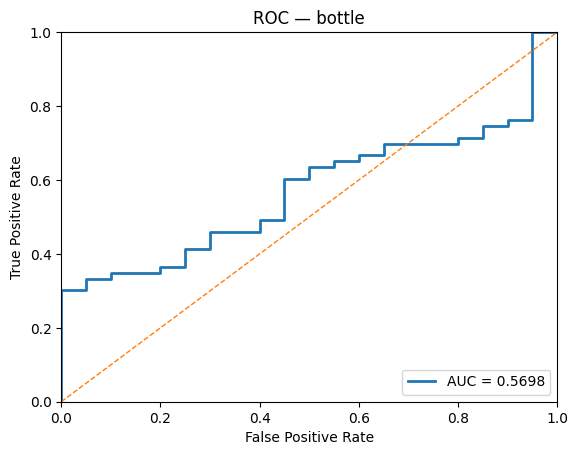

[bottle] Saved ROC: runs/_plots/roc_bottle.png


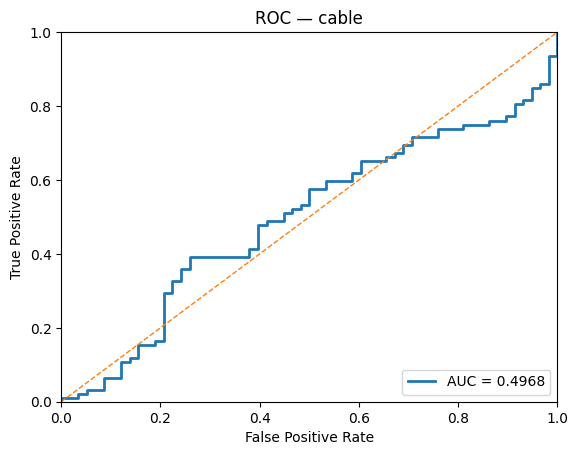

[cable] Saved ROC: runs/_plots/roc_cable.png


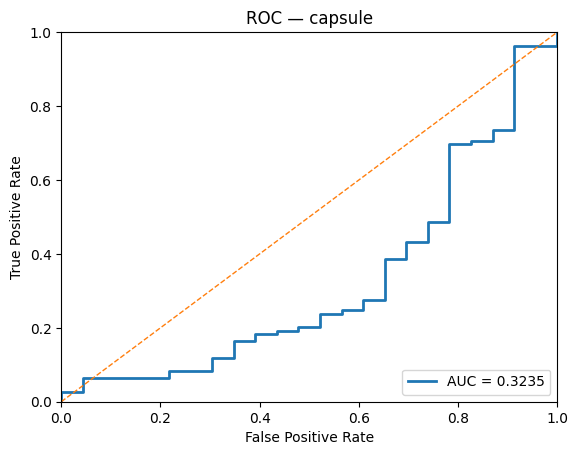

[capsule] Saved ROC: runs/_plots/roc_capsule.png


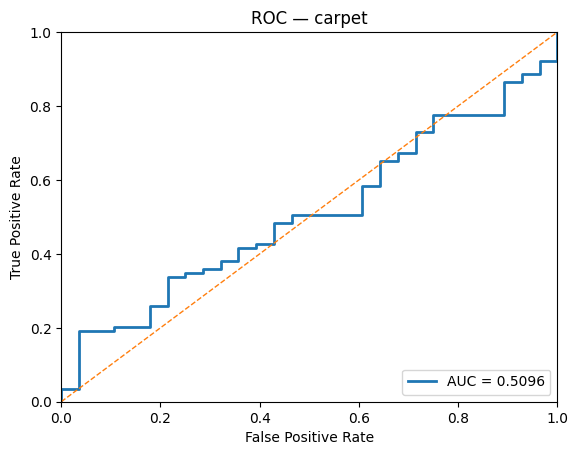

[carpet] Saved ROC: runs/_plots/roc_carpet.png


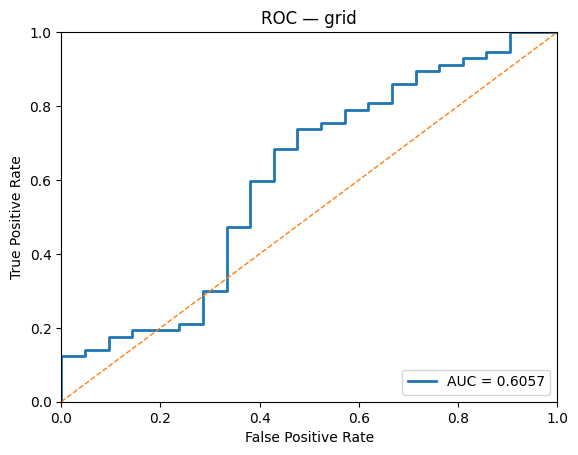

[grid] Saved ROC: runs/_plots/roc_grid.png


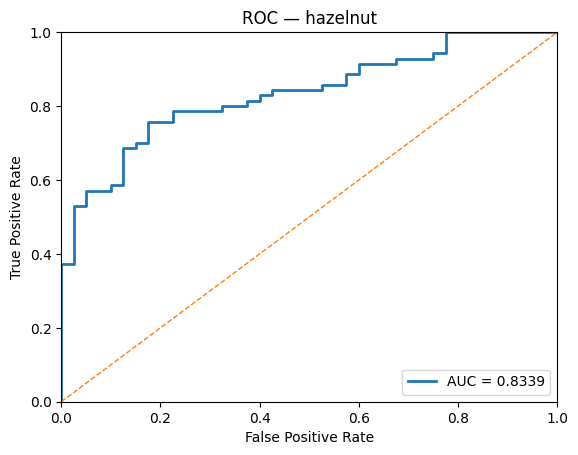

[hazelnut] Saved ROC: runs/_plots/roc_hazelnut.png


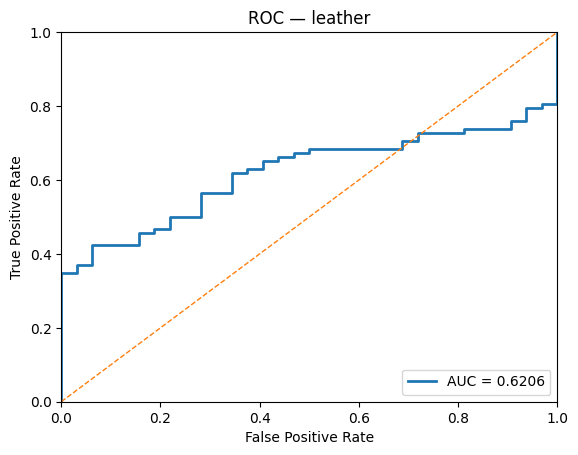

[leather] Saved ROC: runs/_plots/roc_leather.png


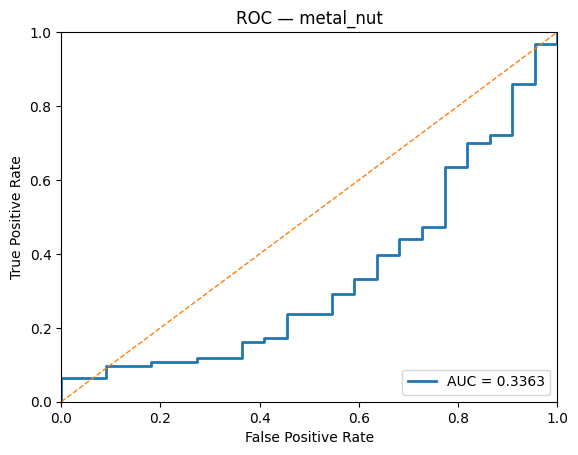

[metal_nut] Saved ROC: runs/_plots/roc_metal_nut.png


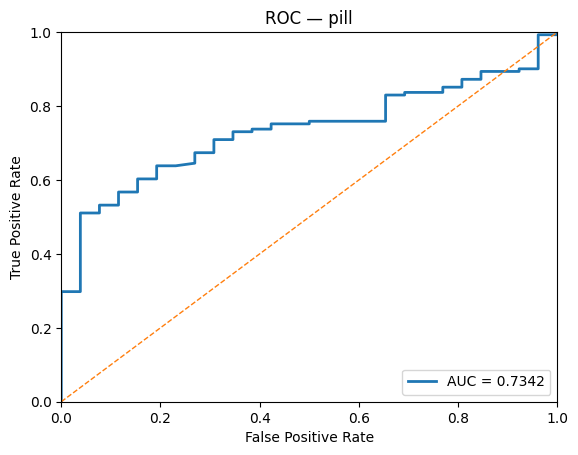

[pill] Saved ROC: runs/_plots/roc_pill.png


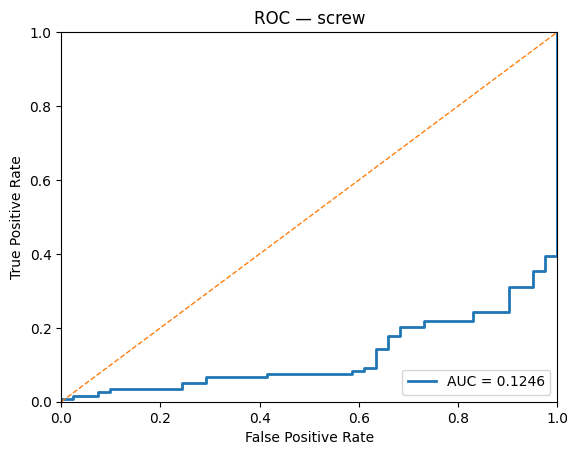

[screw] Saved ROC: runs/_plots/roc_screw.png


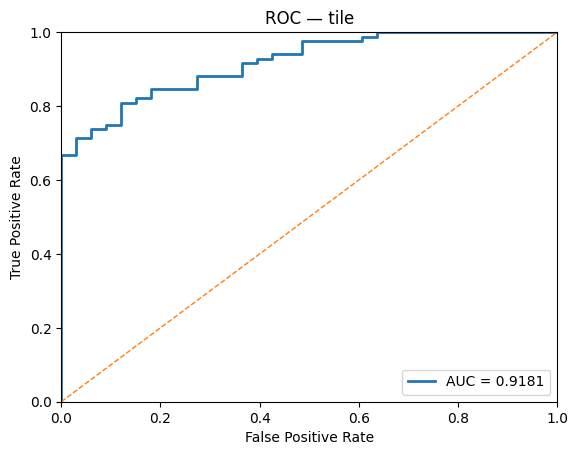

[tile] Saved ROC: runs/_plots/roc_tile.png


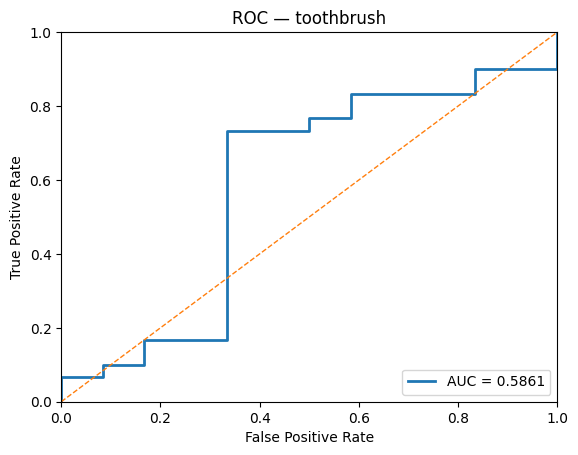

[toothbrush] Saved ROC: runs/_plots/roc_toothbrush.png


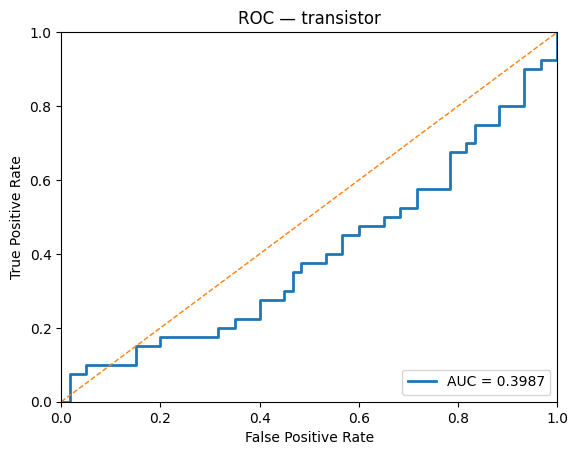

[transistor] Saved ROC: runs/_plots/roc_transistor.png


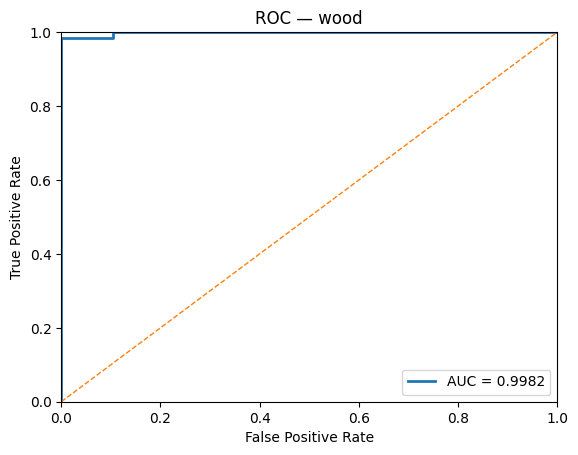

[wood] Saved ROC: runs/_plots/roc_wood.png


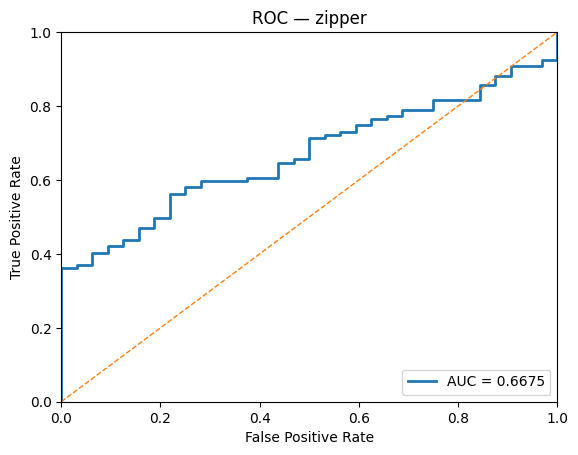

[zipper] Saved ROC: runs/_plots/roc_zipper.png


In [71]:
%run score.py --category each --show

## Prediction

In [91]:
# --- Adjust all thresholds by a constant scale factor ---
import os, json, glob

RUNS_DIR = "runs"
CHOSEN_SCALE = 0.90   # e.g., 0.90 lowers thresholds (more sensitive); 1.10 raises them

updated = []
for d in sorted(glob.glob(os.path.join(RUNS_DIR, "*"))):
    tj = os.path.join(d, "threshold.json")
    if not os.path.isfile(tj):
        continue
    data = json.load(open(tj))
    old_thr = float(data.get("threshold", 0.0))
    new_thr = float(old_thr * CHOSEN_SCALE)
    data["threshold"] = new_thr
    with open(tj, "w") as f:
        json.dump(data, f, indent=2)
    updated.append((os.path.basename(d), old_thr, new_thr))

print(f"Updated {len(updated)} categories:")
for cat, old_thr, new_thr in updated:
    print(f"  {cat:>12s} | old={old_thr:.6f} -> new={new_thr:.6f}")


Updated 15 categories:
        bottle | old=0.034497 -> new=0.031047
         cable | old=0.044316 -> new=0.039884
       capsule | old=0.027213 -> new=0.024492
        carpet | old=0.023986 -> new=0.021587
          grid | old=0.041166 -> new=0.037049
      hazelnut | old=0.036835 -> new=0.033152
       leather | old=0.025592 -> new=0.023033
     metal_nut | old=0.050685 -> new=0.045616
          pill | old=0.016443 -> new=0.014799
         screw | old=0.022499 -> new=0.020249
          tile | old=0.029085 -> new=0.026177
    toothbrush | old=0.041920 -> new=0.037728
    transistor | old=0.074956 -> new=0.067460
          wood | old=0.025425 -> new=0.022882
        zipper | old=0.021014 -> new=0.018913


In [96]:
%run predict.py --runs_dir runs --category each --device cpu


Discovered 15 categories under 'runs'.
      bottle | score=0.032682 | thr=0.031047 | pred=ANOMALY | img=/home/sgowrishetty/mvtec_ad/bottle/test/good/014.png
       cable | score=0.033589 | thr=0.039884 | pred=OK | img=/home/sgowrishetty/mvtec_ad/cable/test/poke_insulation/008.png
     capsule | score=0.017580 | thr=0.024492 | pred=OK | img=/home/sgowrishetty/mvtec_ad/capsule/test/squeeze/014.png
      carpet | score=0.018493 | thr=0.021587 | pred=OK | img=/home/sgowrishetty/mvtec_ad/carpet/test/thread/014.png
        grid | score=0.015162 | thr=0.037049 | pred=OK | img=/home/sgowrishetty/mvtec_ad/grid/test/thread/008.png
    hazelnut | score=0.182911 | thr=0.033152 | pred=ANOMALY | img=/home/sgowrishetty/mvtec_ad/hazelnut/test/print/014.png
     leather | score=0.036209 | thr=0.023033 | pred=ANOMALY | img=/home/sgowrishetty/mvtec_ad/leather/test/poke/014.png
   metal_nut | score=0.016604 | thr=0.045616 | pred=OK | img=/home/sgowrishetty/mvtec_ad/metal_nut/test/scratch/021.png
        

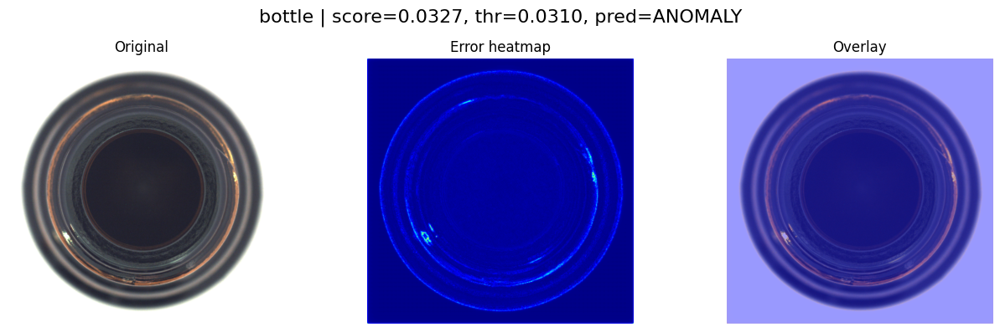

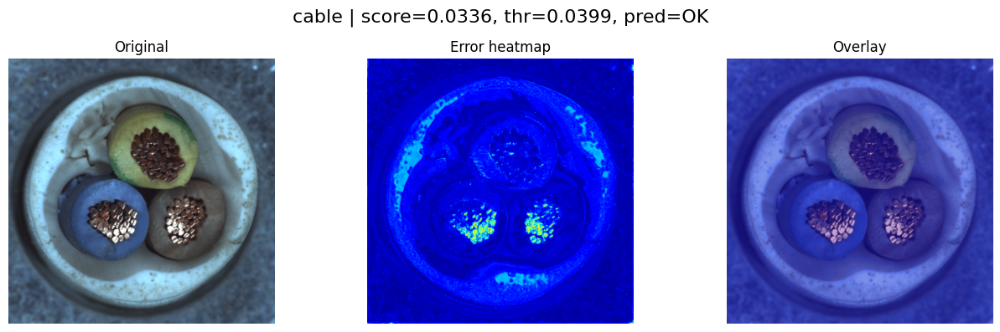

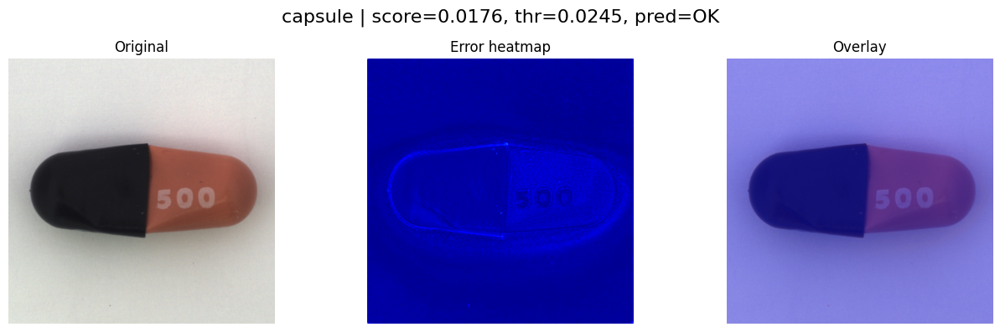

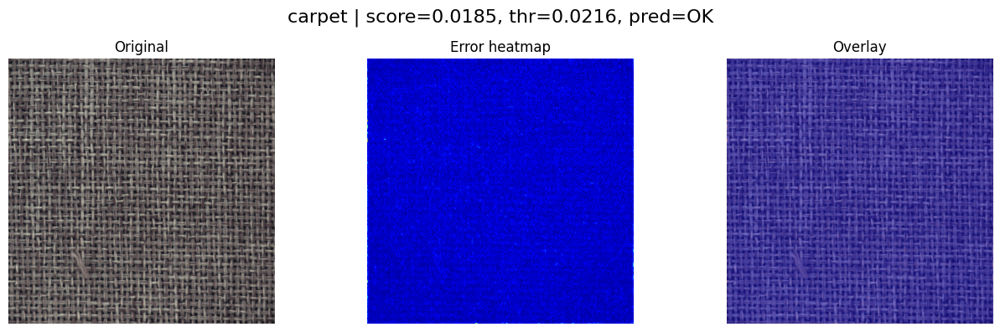

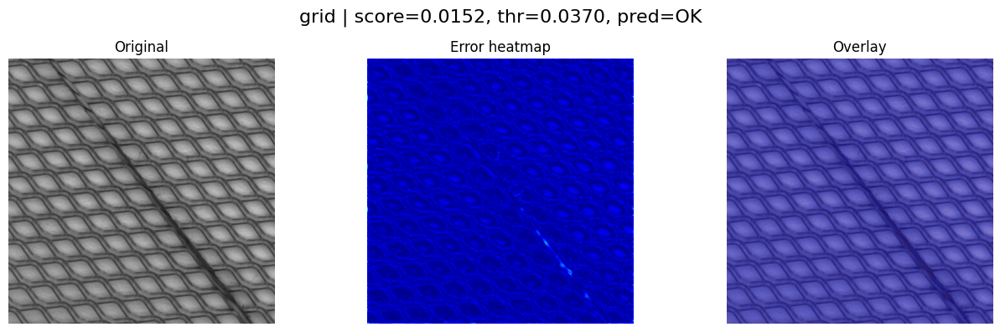

...

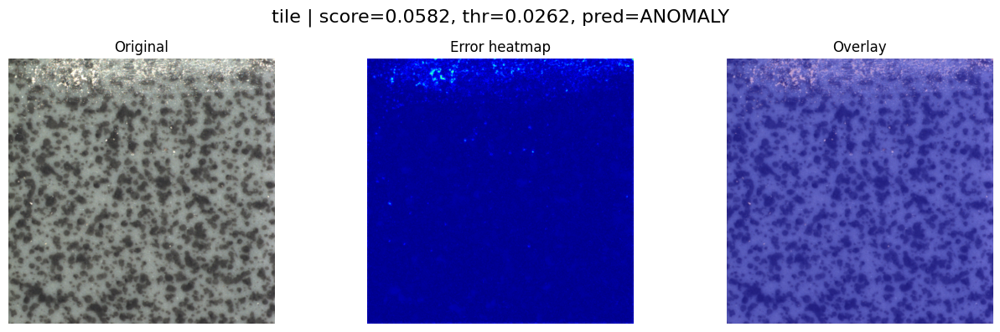

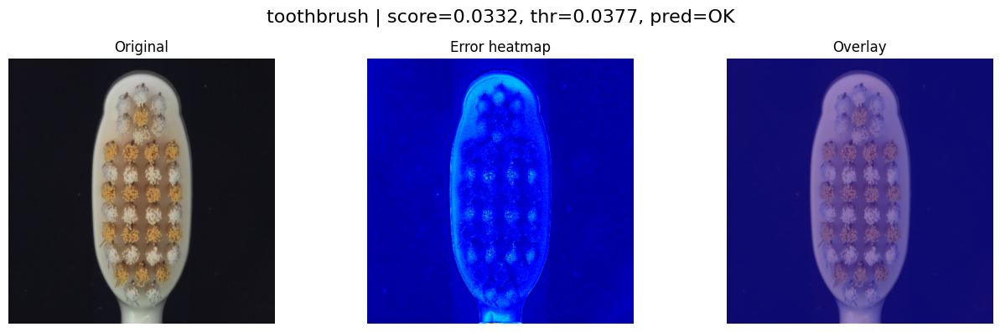

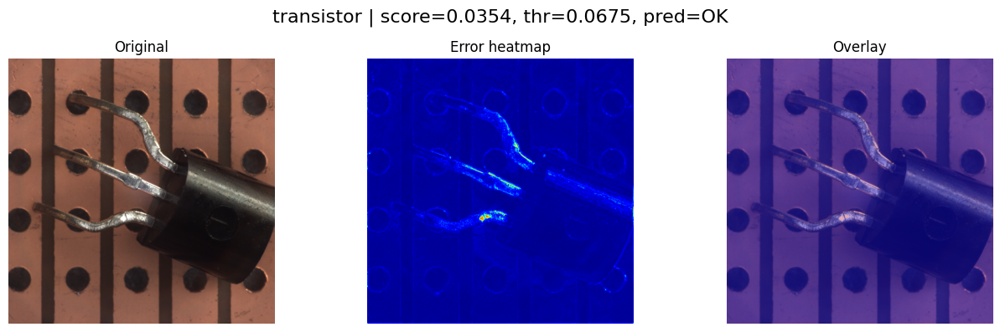

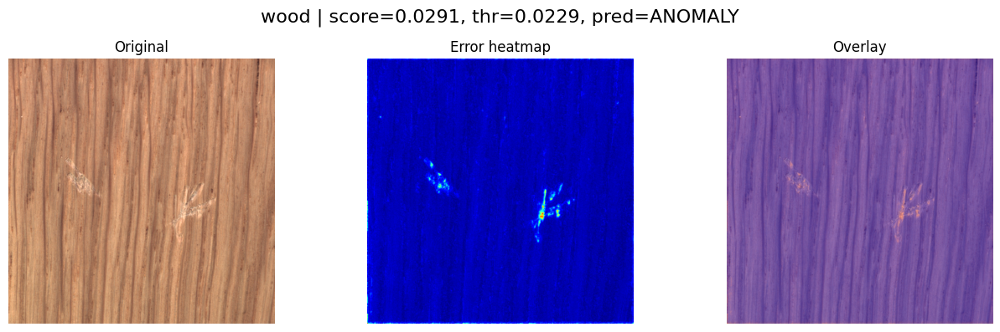

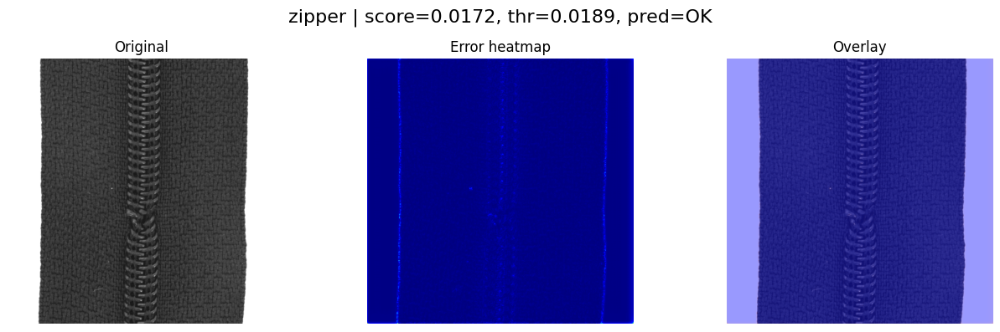

In [102]:
%matplotlib inline
import numpy as np, matplotlib.pyplot as plt
from PIL import Image
import torch
from predict import load_artifacts, infer_one  # from your predict.py

def show_triplet(img_pil, heat, title):
    # normalize heat to [0,1]
    h = (heat - heat.min()) / (heat.max() - heat.min() + 1e-9)

    # --- resize heatmap to original image size for a clean overlay ---
    H, W = img_pil.size[1], img_pil.size[0]  # (height, width)
    h_img = Image.fromarray((h * 255).astype(np.uint8)).resize((W, H), Image.BILINEAR)
    h = np.asarray(h_img).astype(np.float32) / 255.0

    base = np.asarray(img_pil.convert("RGB")).astype(np.float32) / 255.0   # (H,W,3)
    # blue-ish heat overlay
    overlay = (0.6*base + 0.4*np.stack([h, h*0.2, 1.0 - h], axis=-1)).clip(0, 1)

    fig, axes = plt.subplots(1, 3, figsize=(13, 4))
    fig.suptitle(title, fontsize=16)
    axes[0].imshow(img_pil); axes[0].set_title("Original"); axes[0].axis("off")
    im = axes[1].imshow(h, cmap="jet"); axes[1].set_title("Error heatmap"); axes[1].axis("off")
    axes[2].imshow(overlay); axes[2].set_title("Overlay"); axes[2].axis("off")
    plt.tight_layout(); plt.show()

def visualize_from_summary(runs_dir="runs", summary_csv="runs/_pred_vis/predict_summary.csv",
                           device="cpu", topk_frac=0.01):
    import os, pandas as pd
    df = pd.read_csv(summary_csv)
    device = torch.device(device if (device=="cpu" or torch.cuda.is_available()) else "cpu")

    for _, row in df.iterrows():
        cat, img_p = row["category"], str(row["image"])
        if not os.path.exists(img_p):
            print(f"[{cat}] image missing: {img_p} — skipping"); continue

        run_dir = os.path.join(runs_dir, cat)
        model, tfm, thr, _ = load_artifacts(run_dir, device)
        score, heat = infer_one(model, tfm, img_p, device, topk_frac=topk_frac)

        pred = "ANOMALY" if score >= thr else "OK"
        title = f"{cat} | score={score:.4f}, thr={thr:.4f}, pred={pred}"
        img = Image.open(img_p).convert("RGB")
        show_triplet(img, heat, title)

# run it
visualize_from_summary(
    runs_dir="runs",
    summary_csv="runs/_pred_vis/predict_summary.csv",
    device="cpu",
    topk_frac=0.01
)

## Locking Thresholds and Scoring

In [110]:
!python score.py --config config.yaml --category each

score bottle:   0%|                                       | 0/6 [00:00<?, ?it/s]/home/sgowrishetty/score.py:134: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  y_np = np.array(y)
score cable:   0%|                                       | 0/10 [00:00<?, ?it/s]/home/sgowrishetty/score.py:134: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  y_np = np.array(y)
score capsule:   0%|                                      | 0/9 [00:00<?, ?it/s]/home/sgowrishetty/score.py:134: Deprecati

In [111]:
import glob, pandas as pd, numpy as np, json, os

def best_thresh_for_f1(df):
    # sweep all unique scores as candidates
    cand = np.unique(df["score"].values)
    if len(cand)==0: return None, None
    best_f1, best_t = -1.0, cand[0]
    for t in cand:
        pred = (df["score"].values >= t).astype(int)
        if "label" not in df: continue
        y = df["label"].values
        TP = ((pred==1)&(y==1)).sum()
        FP = ((pred==1)&(y==0)).sum()
        FN = ((pred==0)&(y==1)).sum()
        prec = TP/(TP+FP+1e-9); rec = TP/(TP+FN+1e-9)
        f1 = 2*prec*rec/(prec+rec+1e-9)
        if f1 > best_f1:
            best_f1, best_t = f1, t
    return best_t, best_f1

rows=[]
for csvp in glob.glob("runs/*/test_predictions.csv"):
    cat = csvp.split("/")[1]
    df = pd.read_csv(csvp)
    if "label" not in df or df["label"].isna().all():
        print(f"[{cat}] no labels; skipping")
        continue
    t, f1 = best_thresh_for_f1(df)
    if t is None:
        print(f"[{cat}] no scores; skipping")
        continue
    # write back to the category folder
    th_json = os.path.join("runs", cat, "threshold.json")
    with open(th_json, "w") as f:
        json.dump({"threshold": float(t)}, f, indent=2)
    rows.append([cat, float(t), float(f1)])

summary = pd.DataFrame(rows, columns=["category","new_threshold","F1_est"]).sort_values("F1_est", ascending=False)
summary


,category,new_threshold,F1_est
5,wood,0.012006,0.991597
14,pill,0.011393,0.915584
9,capsule,0.013711,0.904564
1,tile,0.016444,0.901099
8,metal_nut,0.010606,0.894231
11,zipper,0.014018,0.881481
0,bottle,0.025524,0.868966
3,carpet,0.016799,0.864078
4,grid,0.014149,0.857143
13,screw,0.020708,0.853047


In [108]:
import pandas as pd, glob

rows=[]
for p in glob.glob("runs/*/test_predictions.csv"):
    df = pd.read_csv(p)
    cat = p.split("/")[1]
    if "label" in df and df["label"].notna().any():
        TP = ((df.pred==1)&(df.label==1)).sum()
        FP = ((df.pred==1)&(df.label==0)).sum()
        TN = ((df.pred==0)&(df.label==0)).sum()
        FN = ((df.pred==0)&(df.label==1)).sum()
        prec = TP/(TP+FP+1e-9); rec = TP/(TP+FN+1e-9)
        f1 = 2*prec*rec/(prec+rec+1e-9)
        rows.append([cat, TP, FP, TN, FN, prec, rec, f1])
summary = pd.DataFrame(rows, columns=["category","TP","FP","TN","FN","Precision","Recall","F1"]).sort_values("F1")
summary


,category,TP,FP,TN,FN,Precision,Recall,F1
9,capsule,0,0,23,109,0.000000,0.000000,0.000000
10,cable,3,3,55,89,0.500000,0.032609,0.061224
4,grid,2,0,21,55,1.000000,0.035088,0.067797
8,metal_nut,6,1,21,87,0.857143,0.064516,0.120000
7,transistor,3,1,59,37,0.750000,0.075000,0.136364
11,zipper,14,0,32,105,1.000000,0.117647,0.210526
12,hazelnut,20,0,40,50,1.000000,0.285714,0.444444
2,toothbrush,11,4,8,19,0.733333,0.366667,0.488889
14,pill,46,1,25,95,0.978723,0.326241,0.489362
5,wood,20,0,19,40,1.000000,0.333333,0.500000


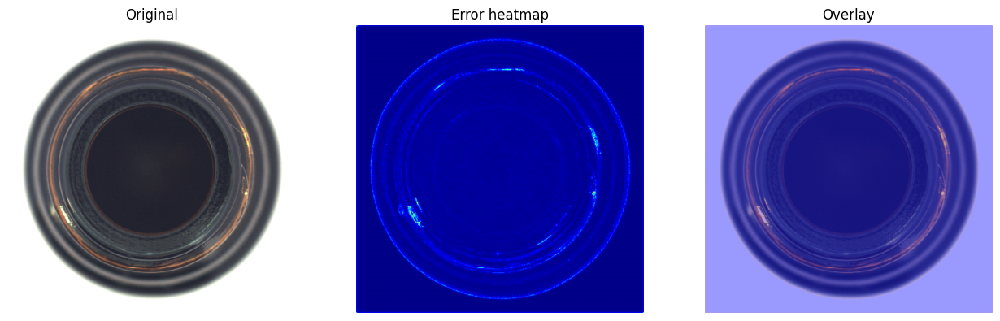

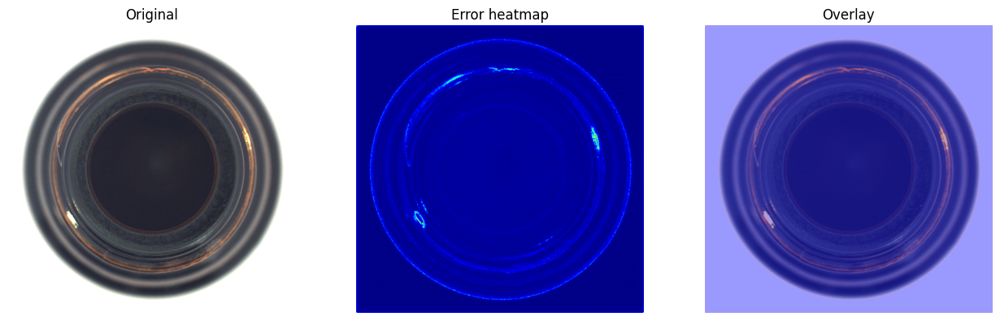

[tile] no FP


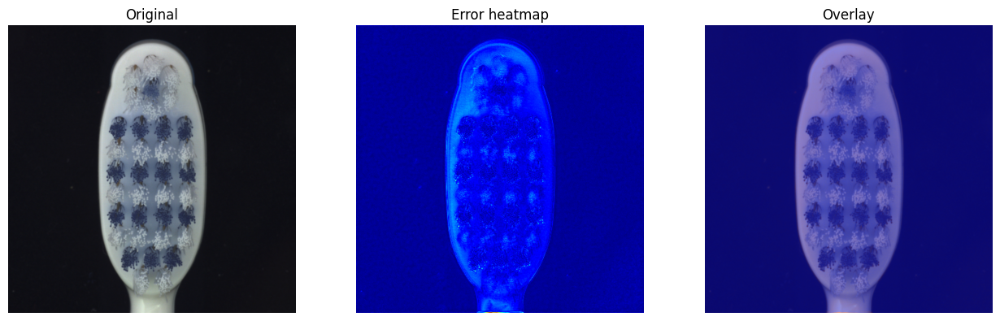

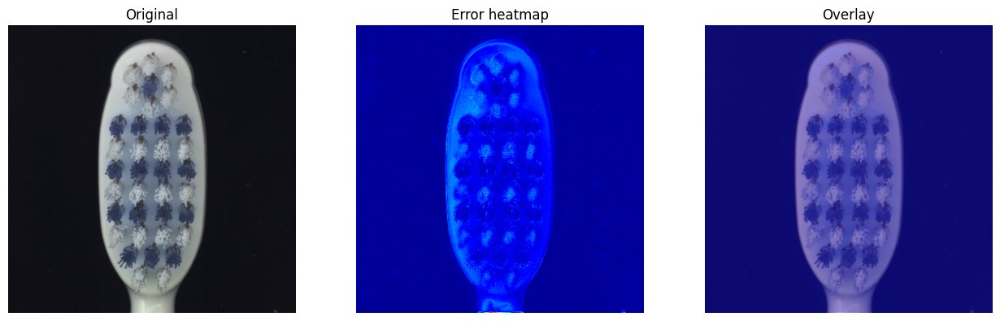

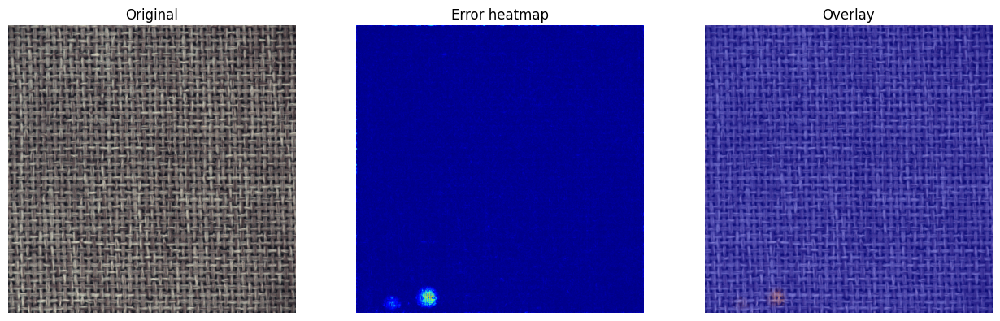

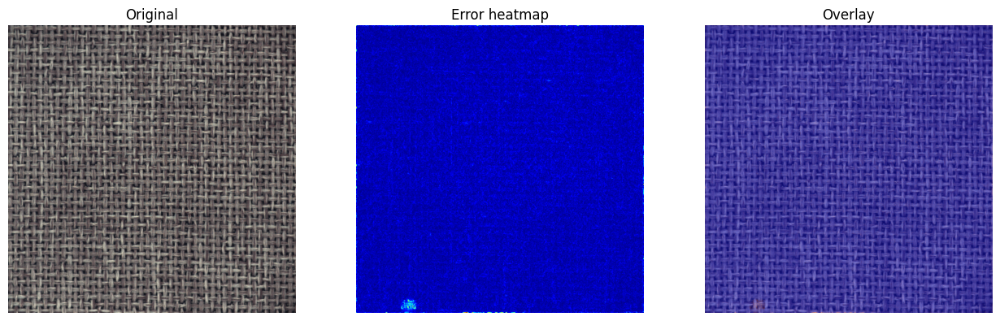

[grid] no FP
[wood] no FP


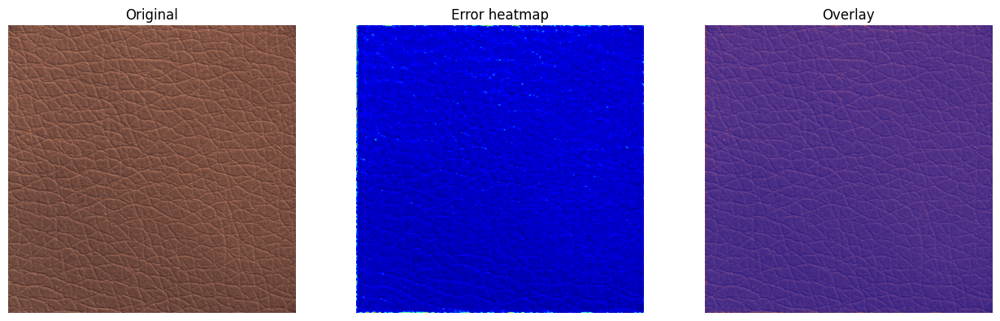

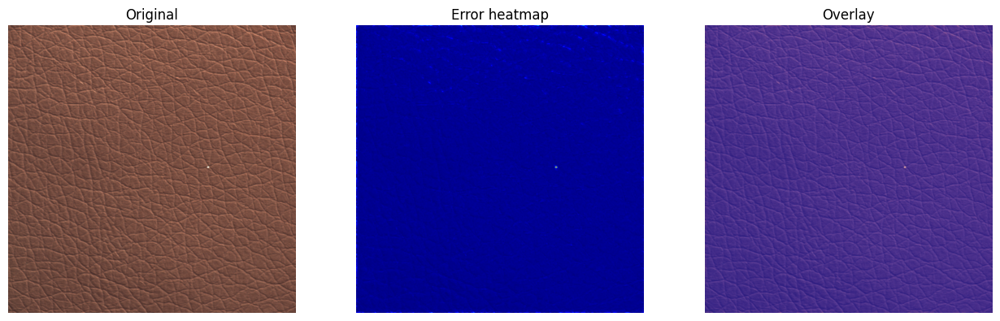

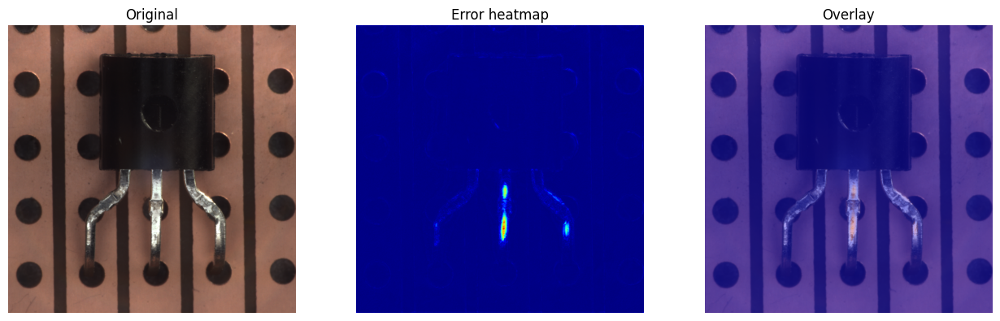

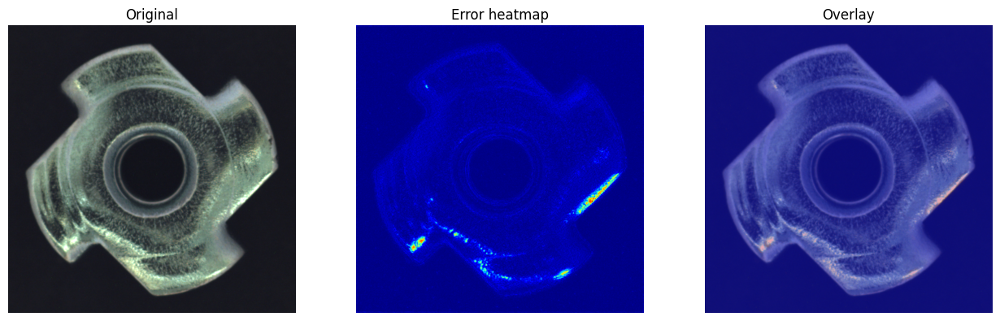

[capsule] no FP


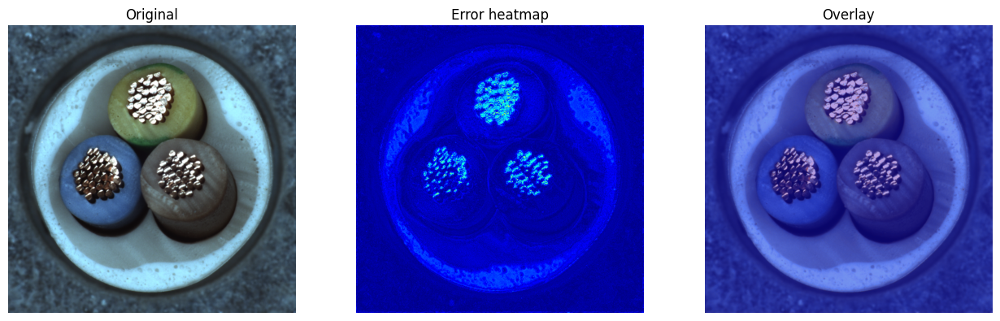

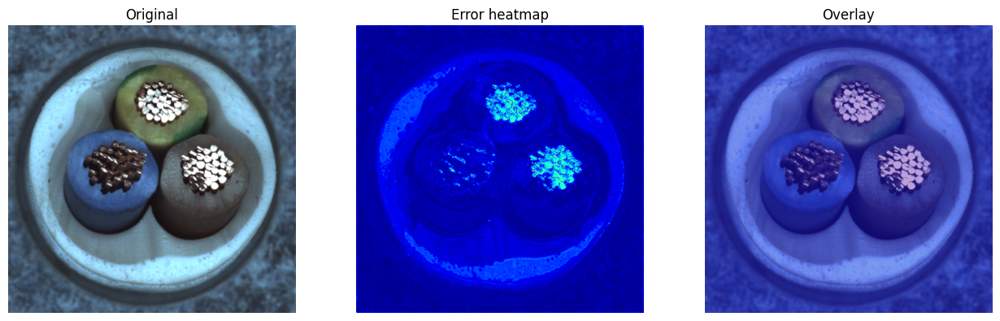

[zipper] no FP
[hazelnut] no FP


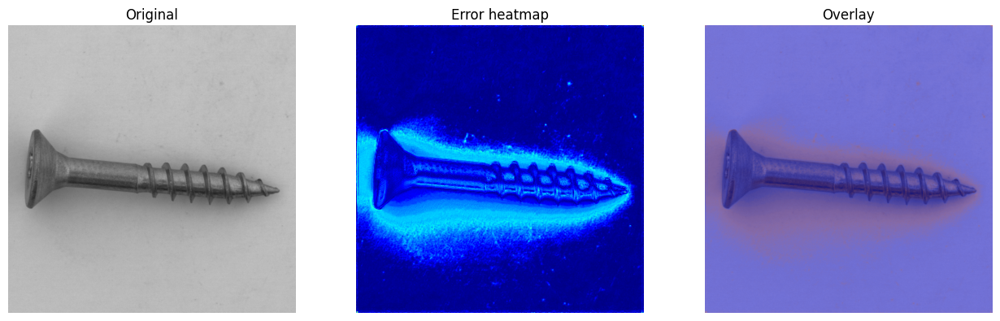

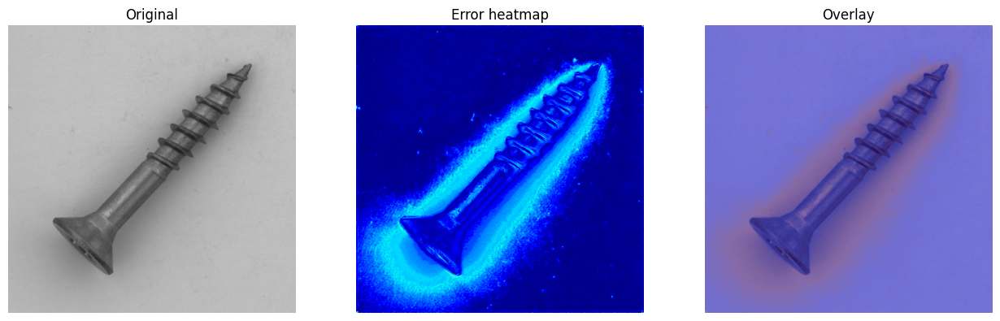

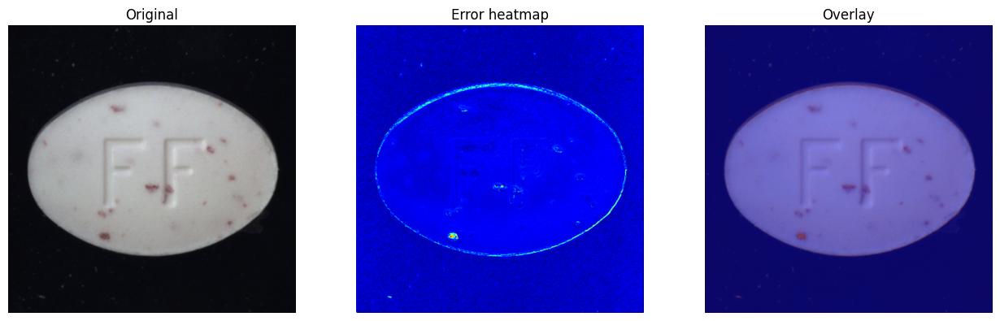

In [109]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt
from PIL import Image
from predict import load_artifacts, infer_one
import torch, os, glob

def show_triplet(img_pil, heat, title):
    h = (heat - heat.min())/(heat.max()-heat.min()+1e-9)
    H,W = img_pil.size[1], img_pil.size[0]
    from PIL import Image as PImage
    h = np.asarray(PImage.fromarray((h*255).astype(np.uint8)).resize((W,H))).astype(np.float32)/255.0
    base = np.asarray(img_pil.convert("RGB")).astype(np.float32)/255.0
    overlay = (0.6*base + 0.4*np.stack([h, h*0.2, 1-h], -1)).clip(0,1)
    fig,ax = plt.subplots(1,3,figsize=(13,4))
    ax[0].imshow(img_pil); ax[0].set_title("Original"); ax[0].axis("off")
    im=ax[1].imshow(h, cmap="jet"); ax[1].set_title("Error heatmap"); ax[1].axis("off")
    ax[2].imshow(overlay); ax[2].set_title("Overlay"); ax[2].axis("off")
    plt.tight_layout(); plt.show()

def show_examples(kind="FP", k=2):
    for pred_csv in glob.glob("runs/*/test_predictions.csv"):
        cat = pred_csv.split("/")[1]
        df = pd.read_csv(pred_csv)
        if "label" not in df: continue
        if kind=="FP":
            ex = df[(df.pred==1)&(df.label==0)].head(k)
        elif kind=="FN":
            ex = df[(df.pred==0)&(df.label==1)].head(k)
        else:
            ex = df[(df.pred==1)&(df.label==1)].head(k)
        if ex.empty: 
            print(f"[{cat}] no {kind}"); 
            continue
        run_dir = os.path.join("runs", cat)
        device = torch.device("cpu")
        model, tfm, thr, _ = load_artifacts(run_dir, device)
        for _,r in ex.iterrows():
            p = r["path"]
            img = Image.open(p).convert("RGB")
            score, heat = infer_one(model, tfm, p, device, topk_frac=0.01)
            title = f"{cat} | {kind} | score={score:.4f} thr={thr:.4f}"
            show_triplet(img, heat, title)

show_examples("FP", k=2)   # then try "FN"


## Streamlit UI

In [126]:
!pip install gradio

Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.5/63.5 MB 78.4 MB/s  0:00:00m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 119.8 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 55.3 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 65.3 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 127.0 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28/28 [gradio]27/28 [gradio]client]b]]


In [133]:
import gradio as gr
from app import demo

demo.launch(inline=True, share=True)


Rerunning server... use `close()` to stop if you need to change `launch()` parameters.
----
* Running on public URL: https://34dbf9309fd2573df8.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [130]:
!pip install ipywidgets

Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 27.6 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 72.2 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [ipywidgets]3 [ipywidgets]widgets]
